In [1]:
!which python

/c/Users/junec/AppData/Local/Programs/Python/Python38/python


In [2]:
import struct 
struct.calcsize("P")*8

32

In [3]:
# !pip list

In [4]:
# !pip install openpyxl

In [5]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple
from scipy.signal import savgol_filter

In [6]:
from util import load_data_from_txt, calculate_derivative,convert_timestamp2hour,produce_pressure_4metrics
from baseline import detect_breakpoints_startPoint, detect_breakpoints, detect_breakpoints_2, detect_breakpoints_3,detect_breakpoints_4,detect_breakpoints_startPoint2
from plot import group_index, plot_breakpoints,plot_4_metrics,plot_4_metrics_details
from plot2 import group_index, plot_breakpoints,plot_4_metrics,plot_4_metrics_details,plot_detection_statistics,plot_histogram

In [7]:
#experiment setup
# ground_truth=[2249,  2467,  2805,[2875, 2876],3100,3561,3994,[4228, 4232],4753,4895, 5297,5436,[6543, 6547], 7249,[7544, 7545],7946,[8362, 8364],9025,[9607, 9608],10149,10216, 10528,[10801, 10804],11340,  11479,12363,[13039, 13040],13868, 14086,14438,14774,15341,16098,16616,[17589, 17590],18435,19643,19764,20021,20349,20701,21030,21974,22186,22710,23220,24215,24685,25717,26006,26656, 26759,27023,[27316,27327],27773,[27966,27970],28322,28497,28832,29115]
ground_truth=[]
colum_names ={"pressure":["Elapsed time","Data","first_order_derivative","second_order_derivative"],
                    "rate":["Elapsed time","Liquid rate"]}
pressure_file="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_file="../data_input/EAGE_Shchipanov_2017/Rate.txt"

In [8]:
pressure_df,rate_df,pressure_rate=load_data_from_txt(pressure_file, rate_file)
display(pressure_df)
display(rate_df)

,Elapsed time,Data
0,0.000000,2988.99
1,0.495833,2991.28
2,0.516667,2994.32
3,0.545833,2996.70
4,0.566667,2999.12
...,...,...
29808,4063.495571,7938.65
29809,4065.499737,7939.53
29810,4067.503904,7940.92
29811,4069.508071,7941.22


,Elapsed time,Liquid rate
0,0.433384,-3916.602731
1,2.516718,-3913.489043
2,4.600051,-3911.804387
3,6.641718,-3910.573563
4,7.683384,-3907.017652
...,...,...
10186,4074.862089,-18459.075655
10187,4075.028756,-18423.899451
10188,4075.237089,-18412.745895
10189,4075.362089,-18413.519153


In [9]:
# left=pressure_df.iloc[0:5]
# right=rate_df.iloc[0:5]
# result = pd.merge(left, right, how="outer", on=["Elapsed time"])
# display(left)
# display(right)
# display(result)
# b=result.sort_values(by=['Elapsed time'])
# result
# type(pressure_df.iloc[0]['Elapsed time'])
# pressure_df.iloc[1]['Elapsed time']>rate_df.iloc[0]['Elapsed time']
# b

In [10]:
#calculate first & second derivative
pressure_df=produce_pressure_4metrics(pressure_df,colum_names)
display(pressure_df)
#combine with flow rate
pressure_rate_df = pd.concat([pressure_df, rate_df])
pressure_rate_df=pressure_rate_df.sort_values(by=['Elapsed time'])
# print(pressure_df.shape[0],rate_df.shape[0],pressure_rate_df.shape[0])
# pd.set_option('display.max_rows', pressure_rate_df.shape[0]+1)
display(pressure_rate_df)

,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
29808,4063.495571,7938.65,0.439085,0.126970
29809,4065.499737,7939.53,0.693555,-0.271368
29810,4067.503904,7940.92,0.149688,-0.123142
29811,4069.508071,7941.22,-0.097110,0.000000


,Elapsed time,Data,first_order_derivative,second_order_derivative,Liquid rate
0,0.000000,2988.99,4.618487,284.977831,NaN
0,0.433384,NaN,NaN,NaN,-3916.602731
1,0.495833,2991.28,145.919995,-3087.359588,NaN
2,0.516667,2994.32,81.600002,1184.914121,NaN
3,0.545833,2996.70,116.159996,-1817.279726,NaN
...,...,...,...,...,...
10186,4074.862089,NaN,NaN,NaN,-18459.075655
10187,4075.028756,NaN,NaN,NaN,-18423.899451
10188,4075.237089,NaN,NaN,NaN,-18412.745895
10189,4075.362089,NaN,NaN,NaN,-18413.519153


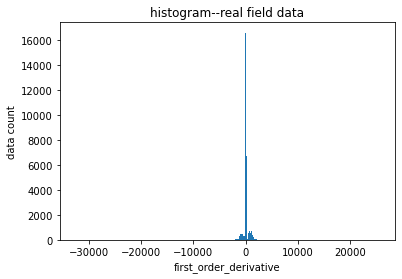

In [11]:
#plot histogram
data=pressure_df["first_order_derivative"]
xlabel="first_order_derivative"
ylabel="data count"
title='histogram--real field data'
plot_histogram(data, xlabel, ylabel,title)

In [12]:
# breakpoints_detected=detect_breakpoints(first_order_derivative)
# print(len(breakpoints_detected))
# print(breakpoints_detected)

In [13]:
# breakpoints_detected=detect_breakpoints_2(first_order_derivative,second_order_derivative)
# print(len(breakpoints_detected))
# # print(breakpoints_detected)
# plot_detection_statistics(breakpoints_detected,ground_truth)
# plot_4_metrics(pressure_df,
#                rate_df,
#                breakpoints_detected,
#                ground_truth,
#                colum_names)

**without denosing**

In [14]:
#baseline method
first_order_derivative=pressure_df["first_order_derivative"]
second_order_derivative=pressure_df["second_order_derivative"]
noise_threshold=2
breakpoints_detected_3=detect_breakpoints_3(first_order_derivative,second_order_derivative,noise_threshold)
print(len(breakpoints_detected_3))
# print(breakpoints_detected)
plot_detection_statistics(breakpoints_detected_3,ground_truth)

993.2336512455328 192914.8008199997
116


findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


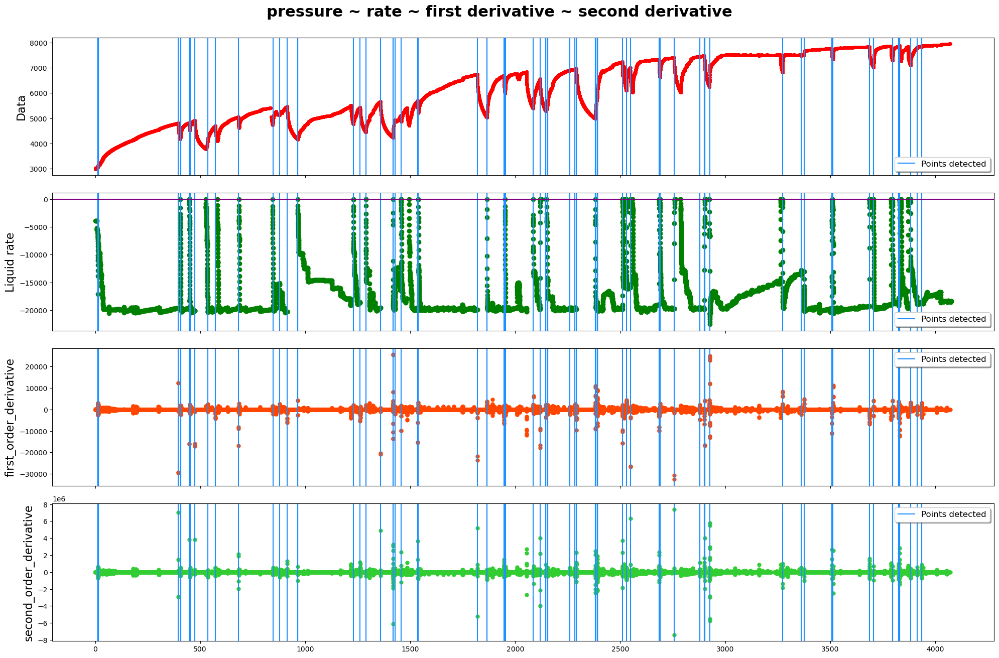

In [15]:
plot_4_metrics(pressure_df,
               rate_df,
               breakpoints_detected_3,
               ground_truth,
               colum_names)

detected 116 points as breakpoints
The plot is devided into 43 rows
------row 1-----detected points:[66, 67, 157, 172, 174, 175, 236, 241, 268, 269, 278, 292, 293, 301, 302]


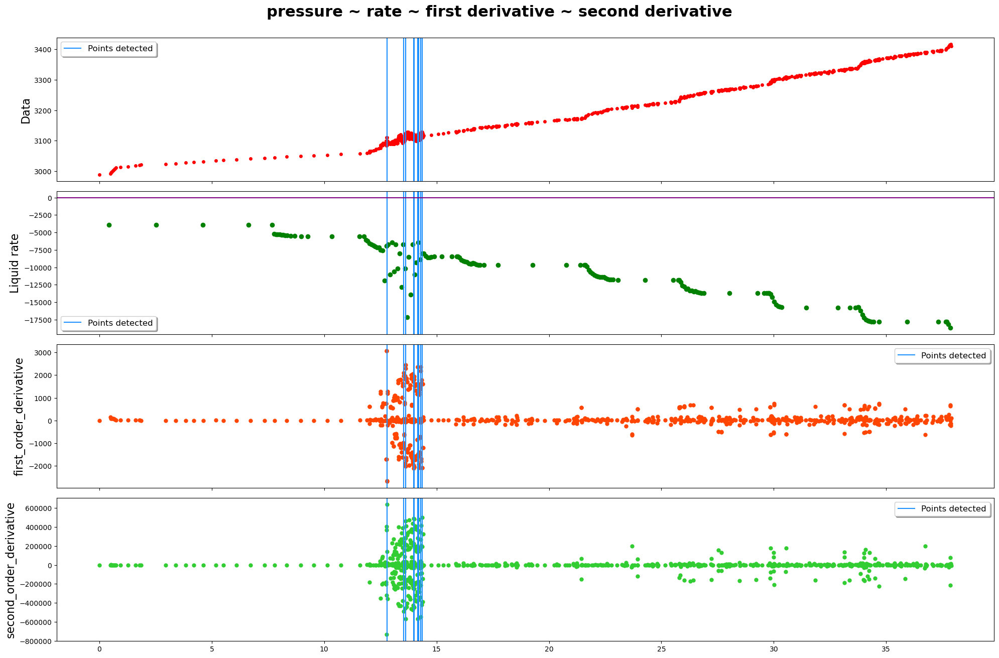

------row 2-----detected points:[]


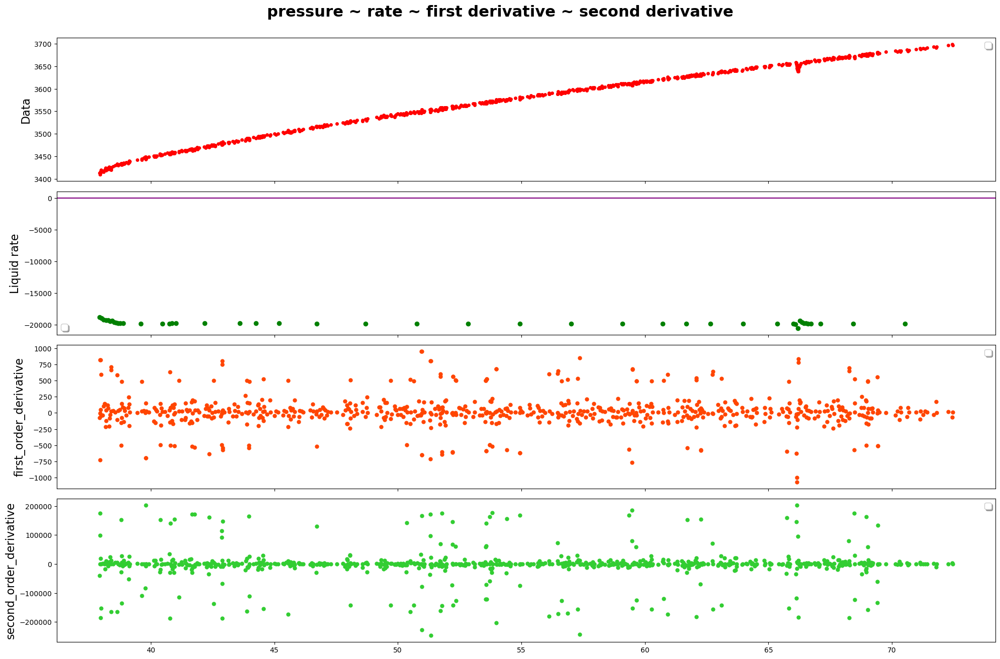

------row 3-----detected points:[]


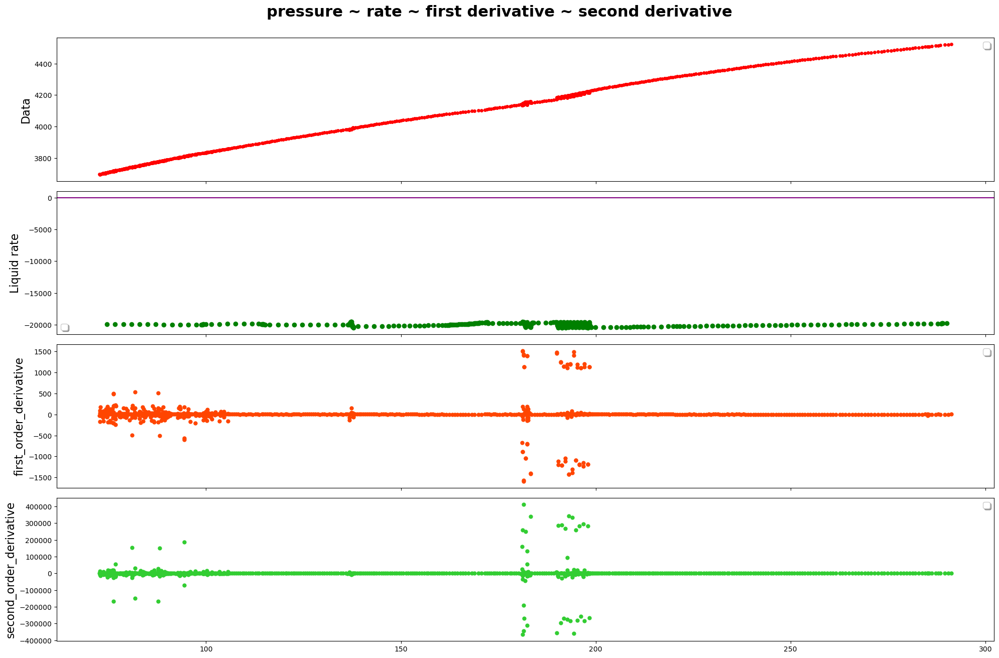

------row 4-----detected points:[2248, 2252, 2576, 2577]


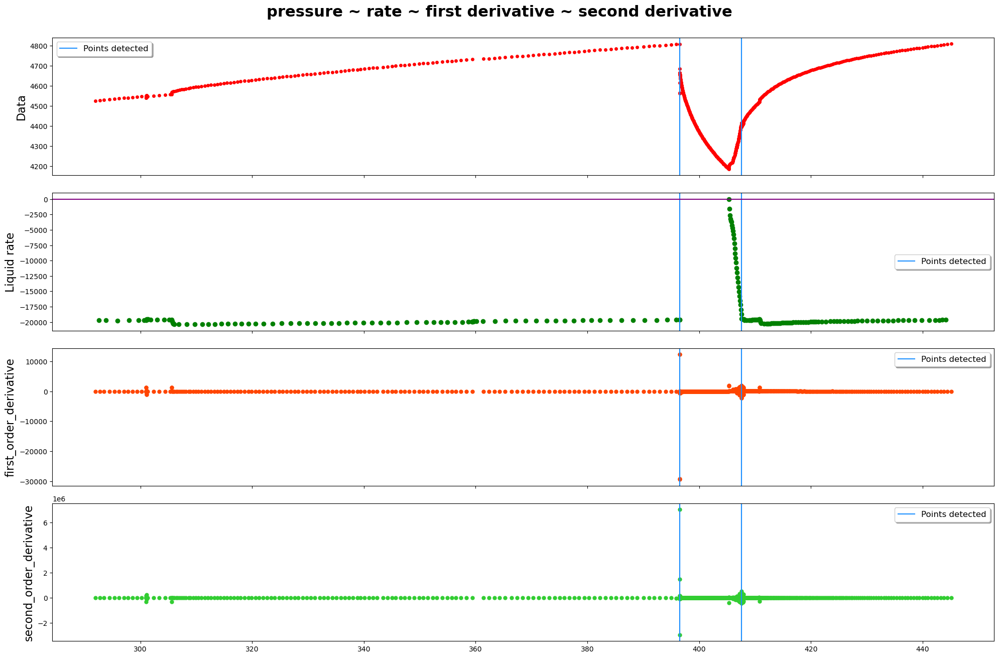

------row 5-----detected points:[2804, 2875, 2876, 2948, 3095]


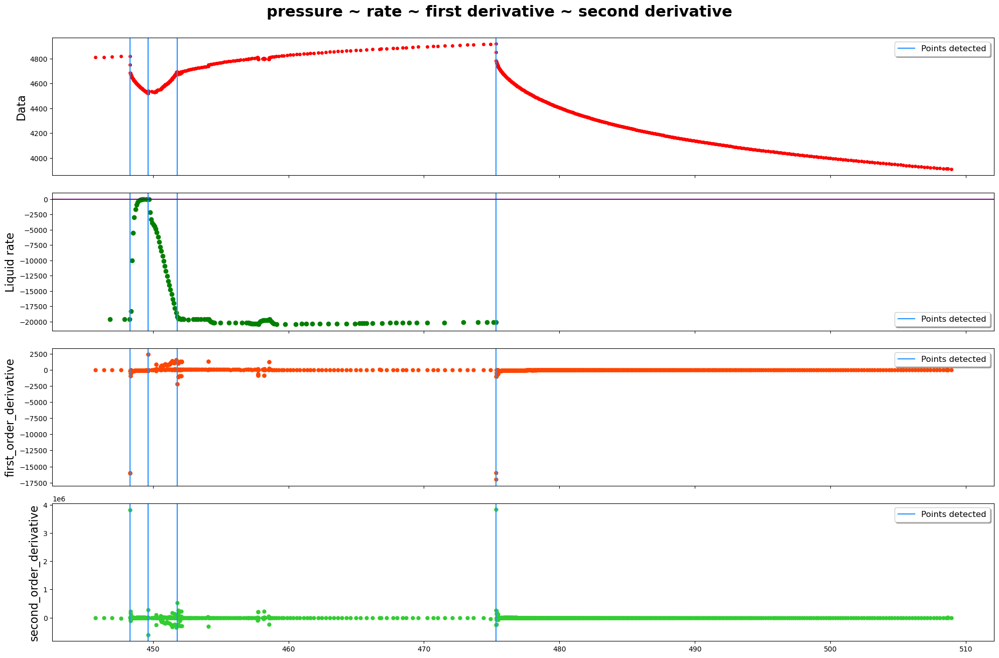

------row 6-----detected points:[3694, 3988, 3989]


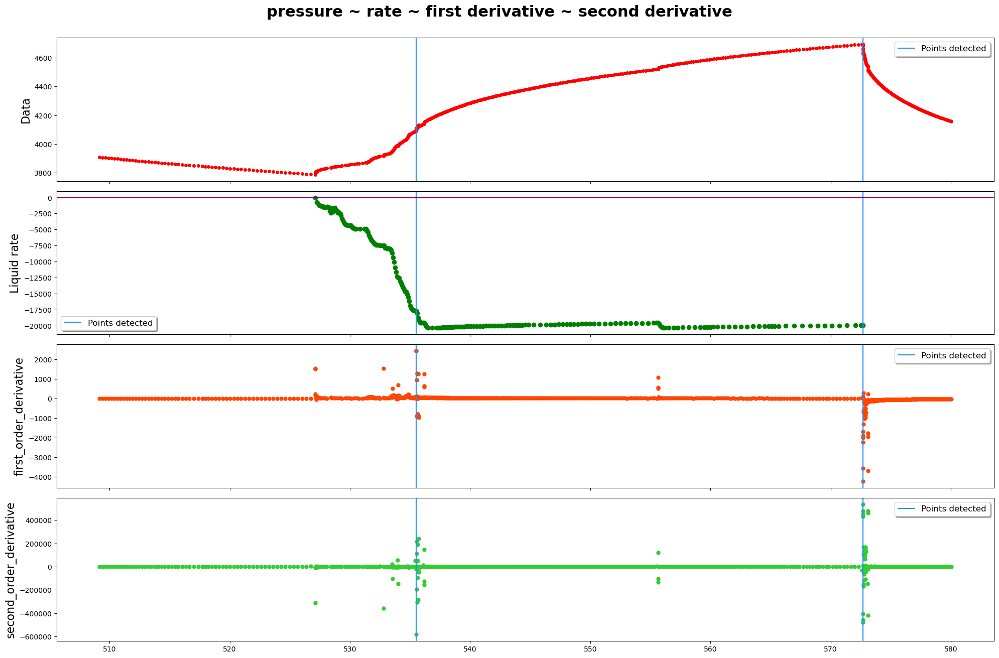

------row 7-----detected points:[4762]


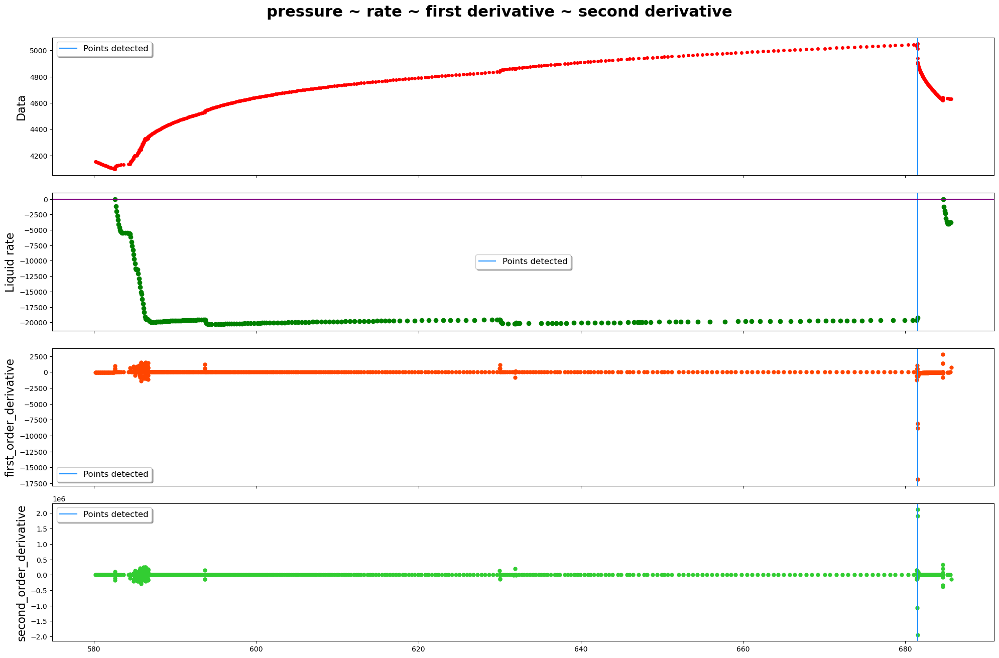

------row 8-----detected points:[5524]


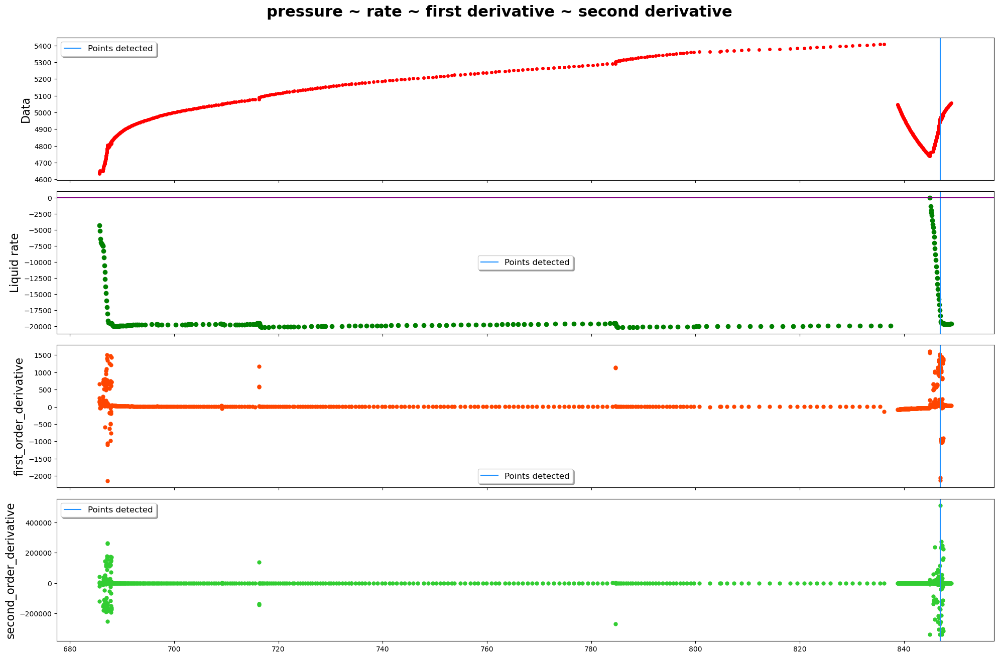

------row 9-----detected points:[5771, 5986]


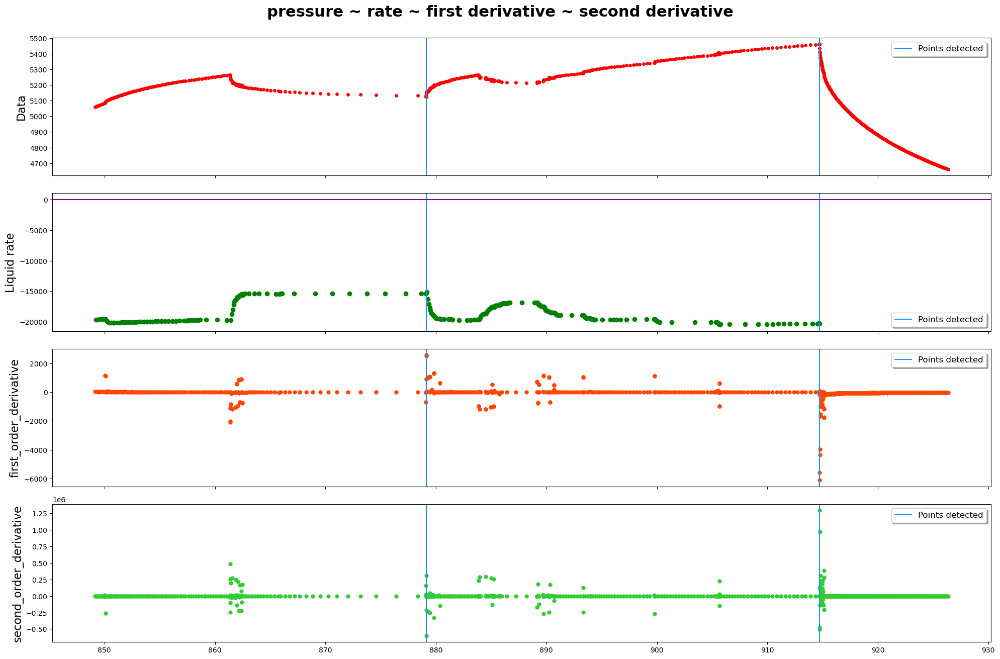

------row 10-----detected points:[6544, 6546, 6547]


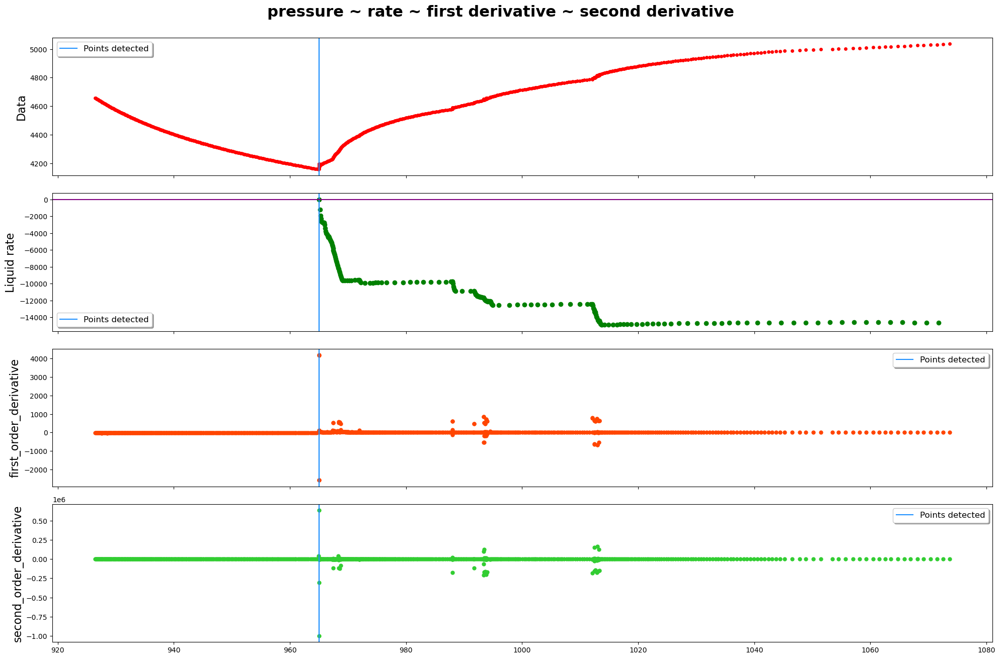

------row 11-----detected points:[7544, 7545]


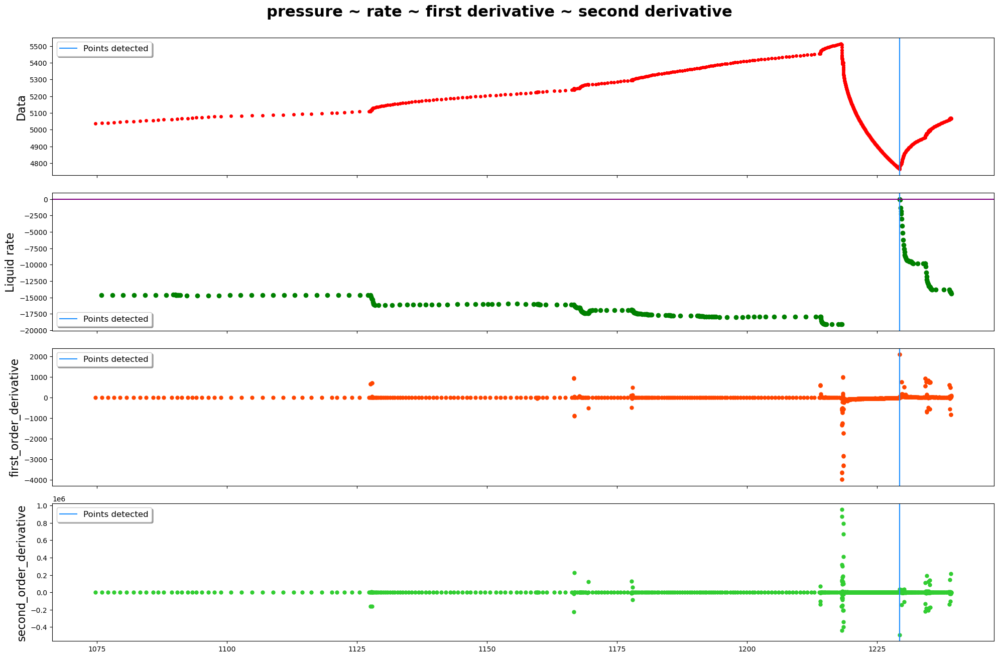

------row 12-----detected points:[7946, 8361, 8362]


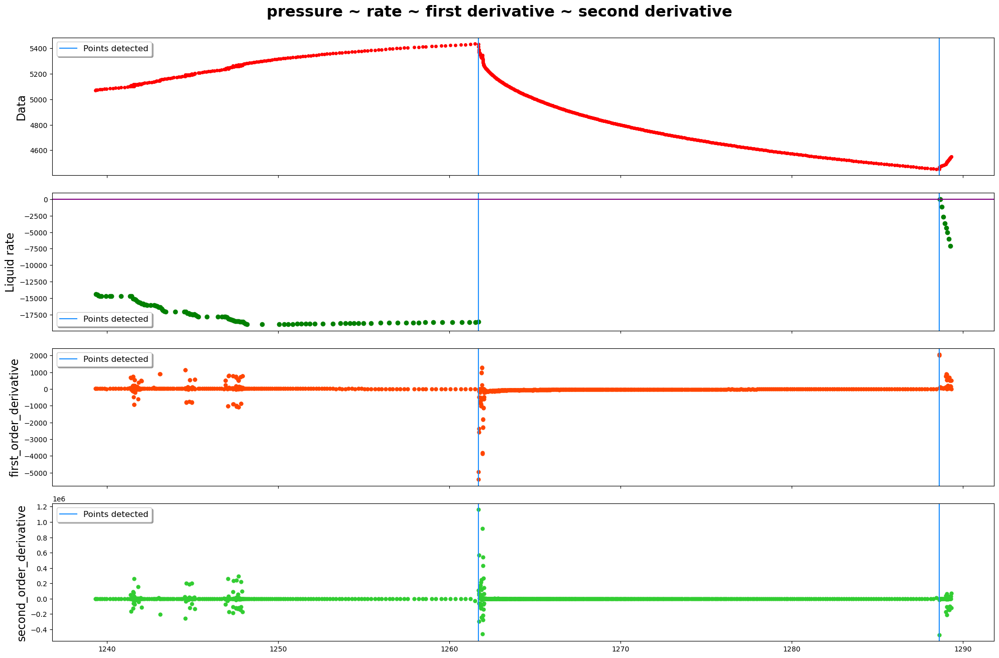

------row 13-----detected points:[9025]


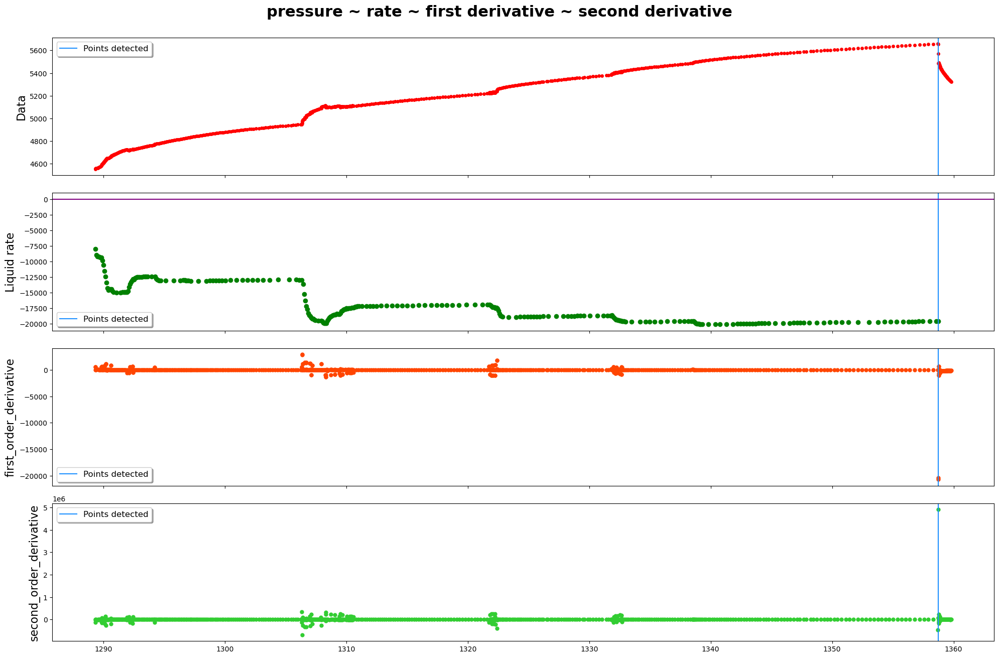

------row 14-----detected points:[9620, 9629, 9638]


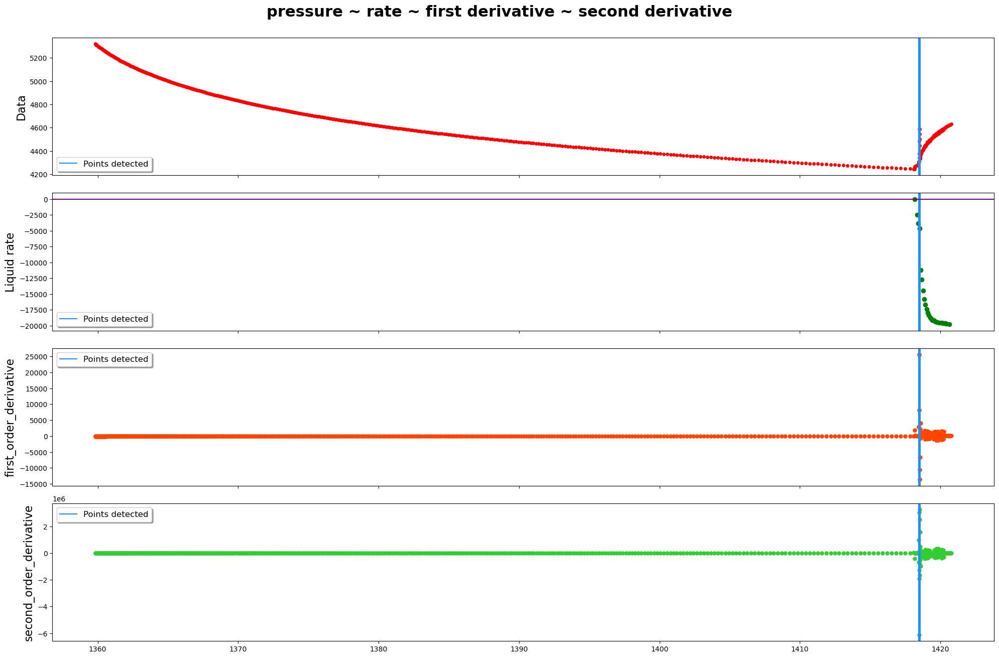

------row 15-----detected points:[9961, 10150]


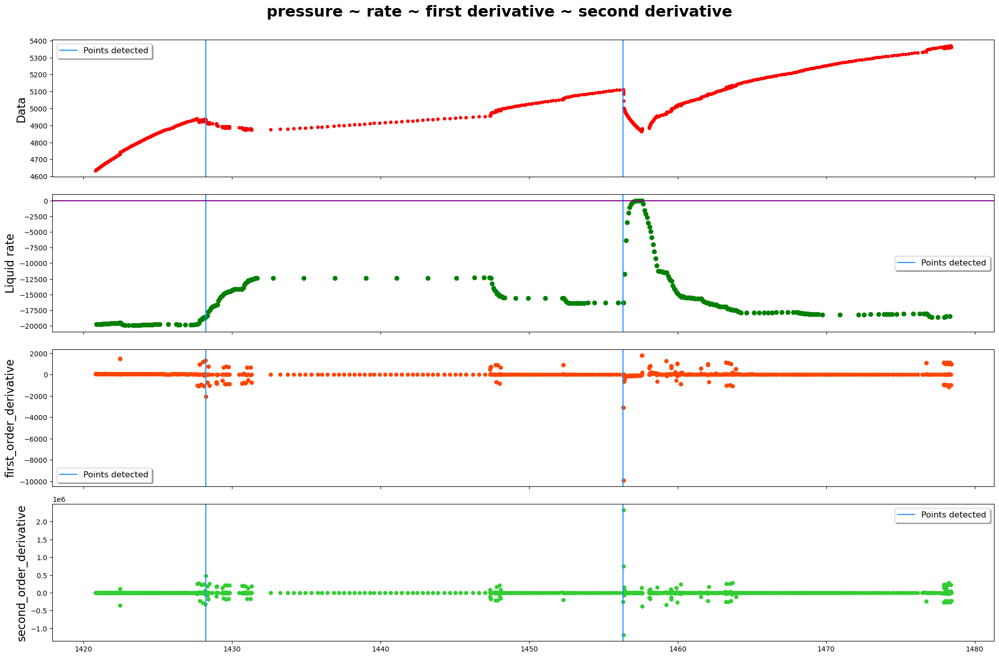

------row 16-----detected points:[]


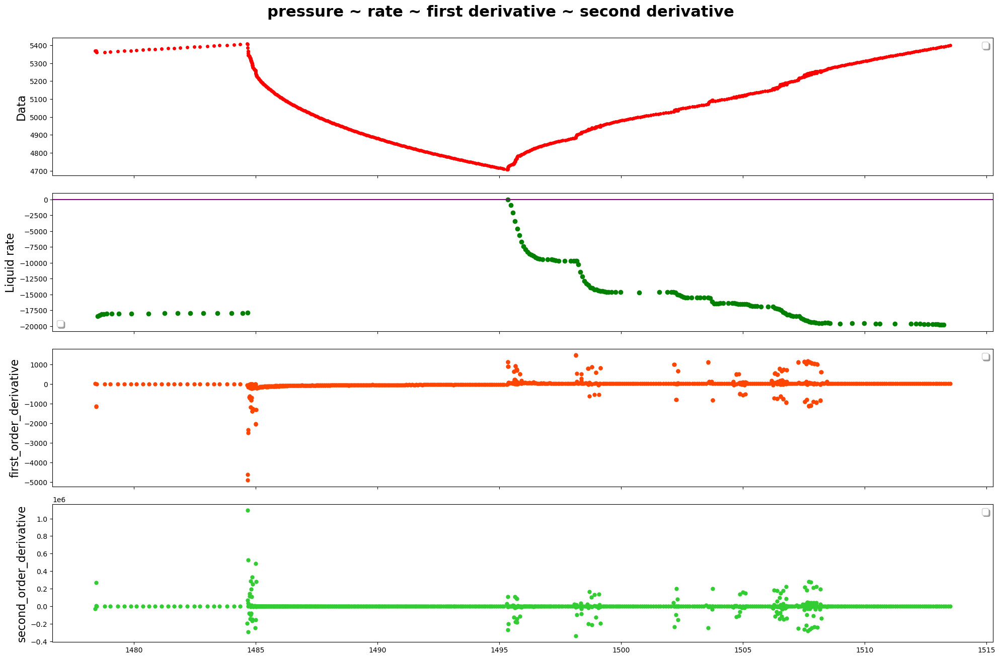

------row 17-----detected points:[11340, 11475, 11483]


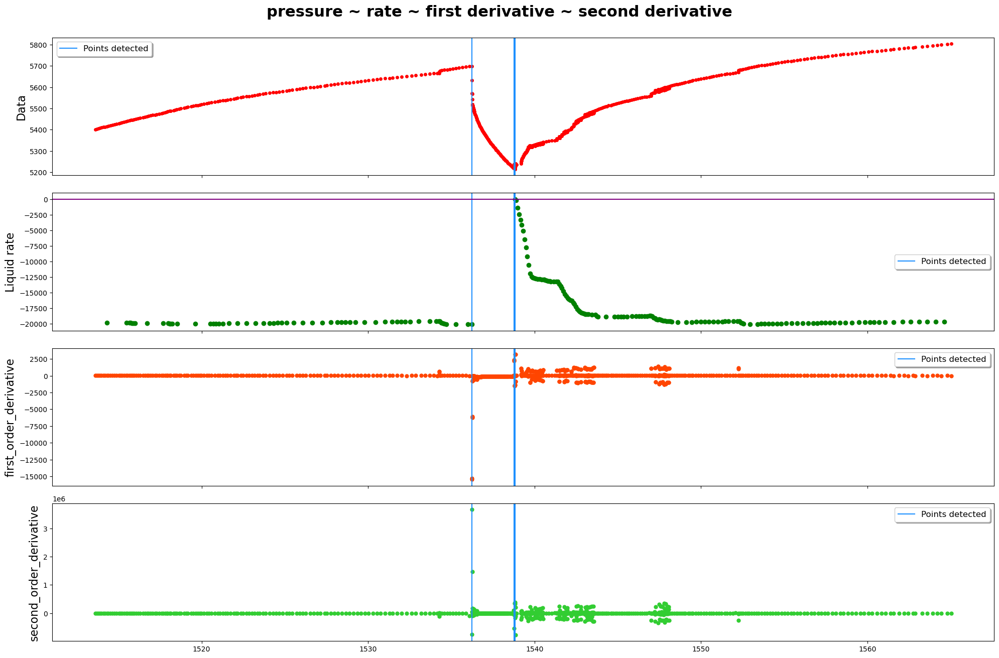

------row 18-----detected points:[12363]


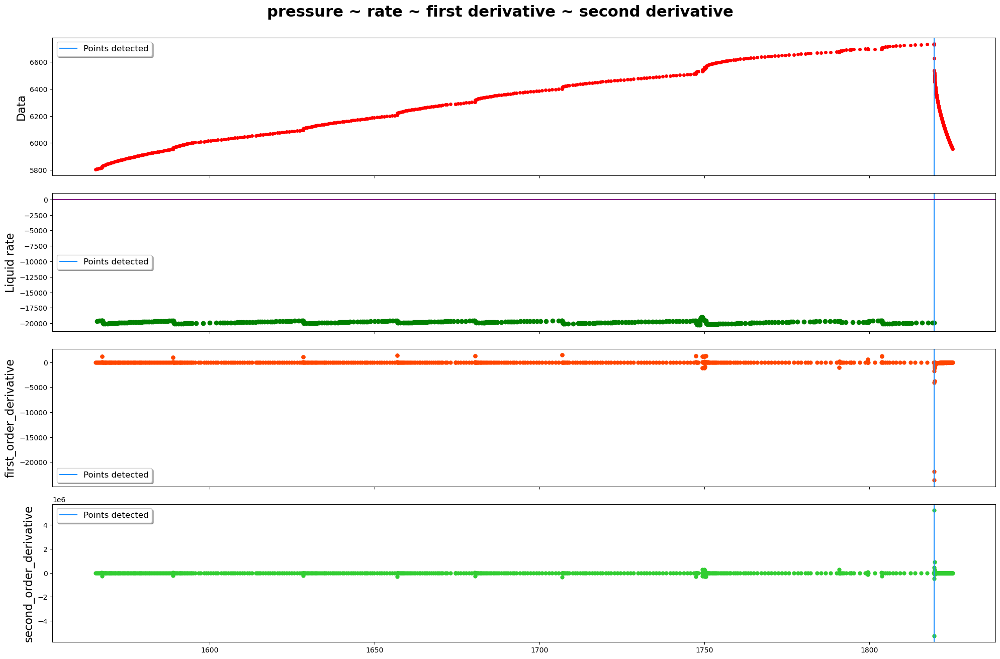

------row 19-----detected points:[13039, 13040, 13053]


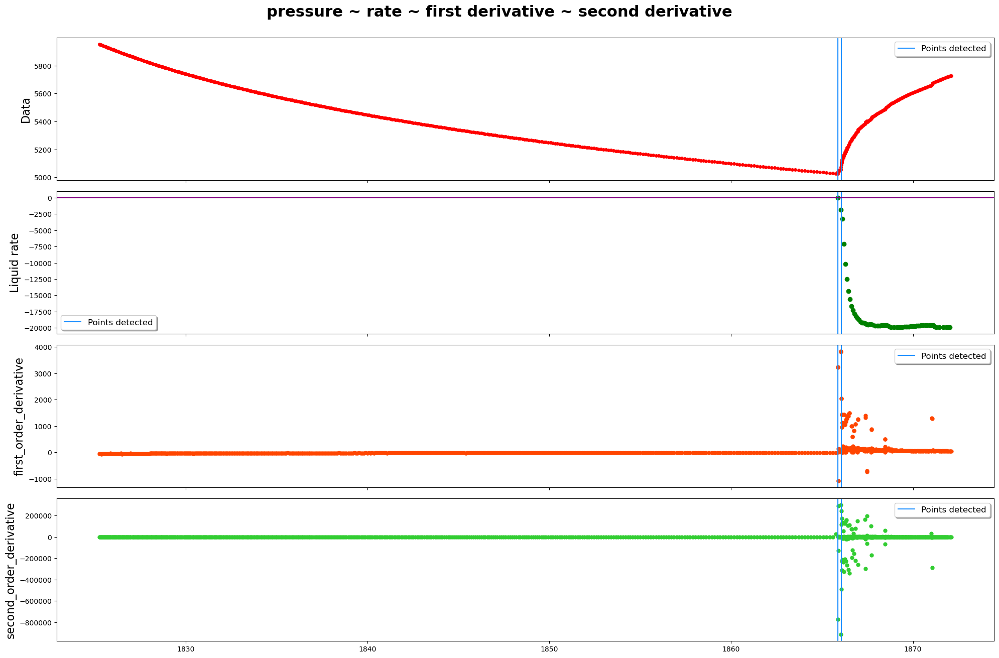

------row 20-----detected points:[13868]


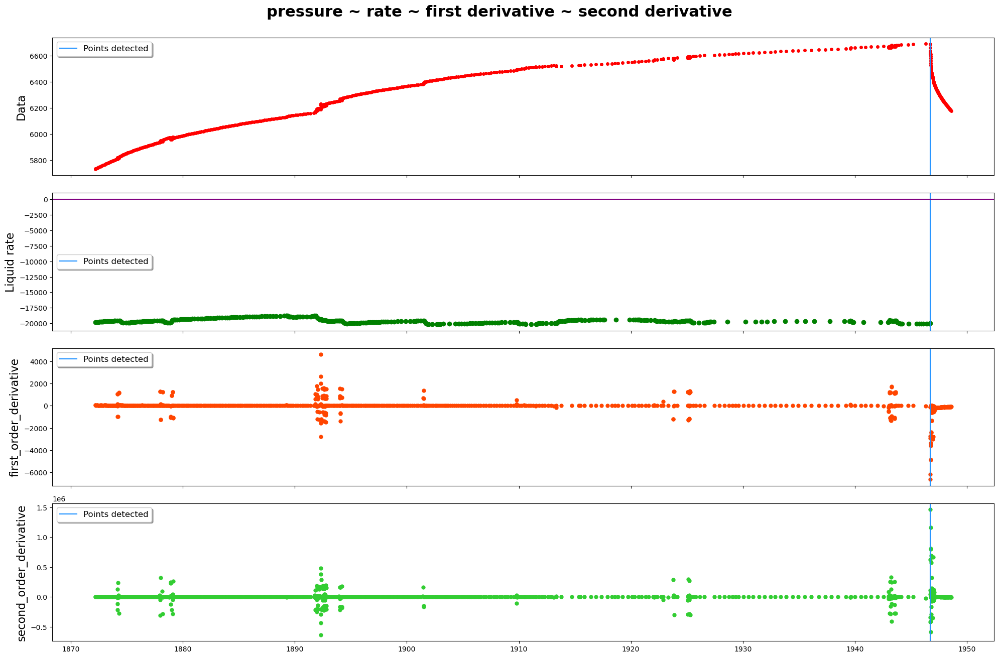

------row 21-----detected points:[14085, 14086, 14191]


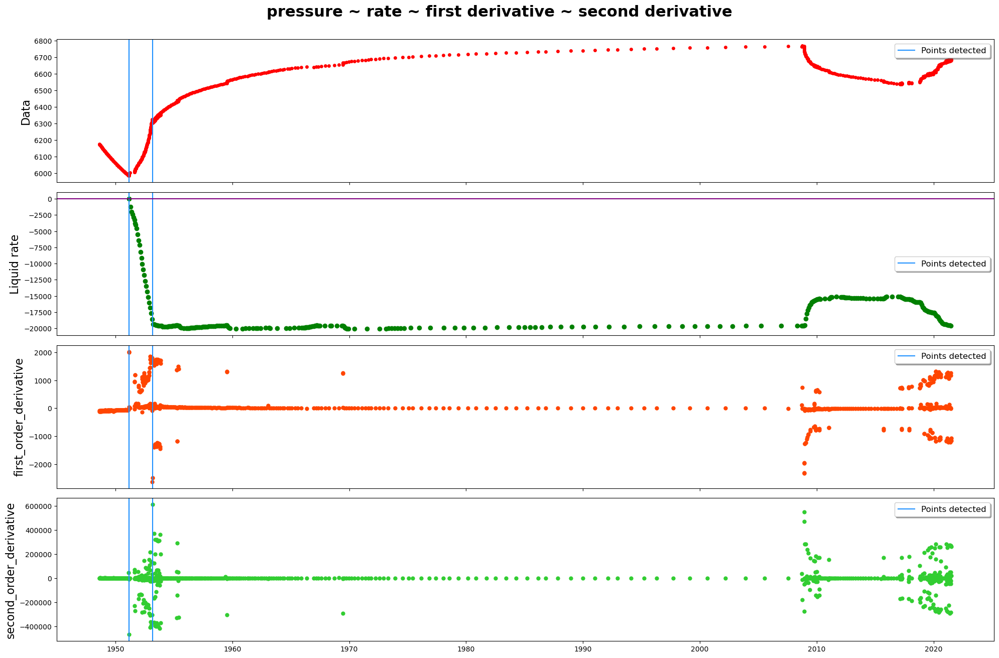

------row 22-----detected points:[15335]


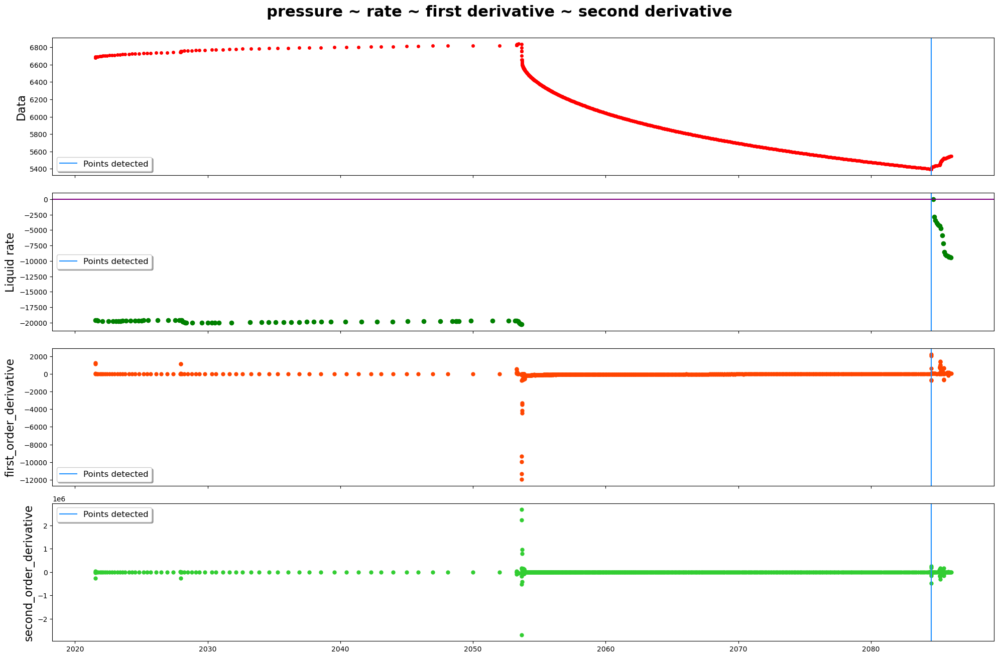

------row 23-----detected points:[16098]


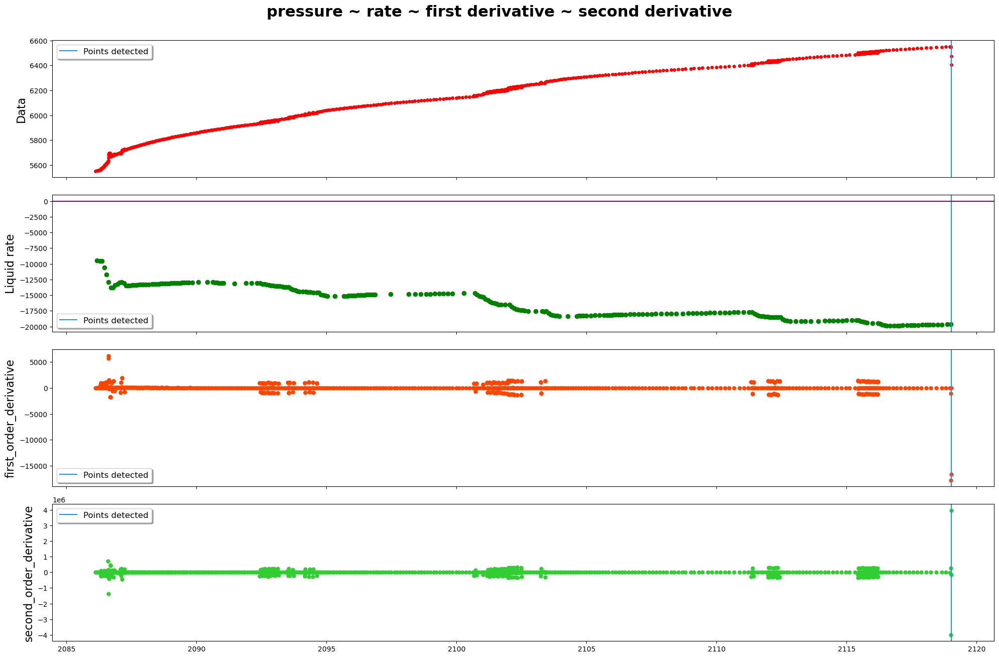

------row 24-----detected points:[16571, 16572, 16585, 16586, 16594, 16764, 16765]


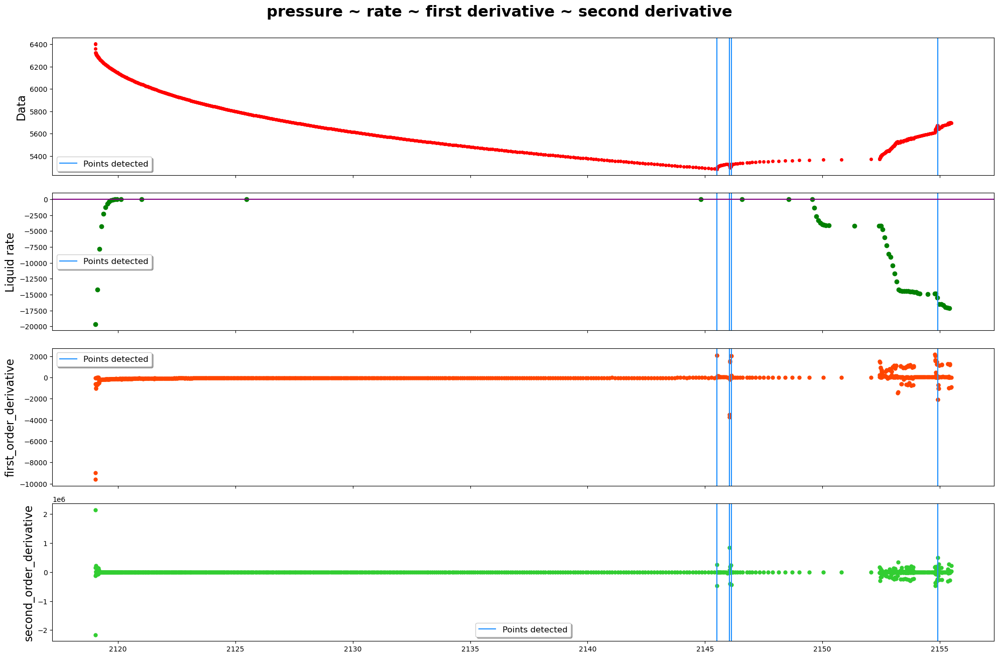

------row 25-----detected points:[17473]


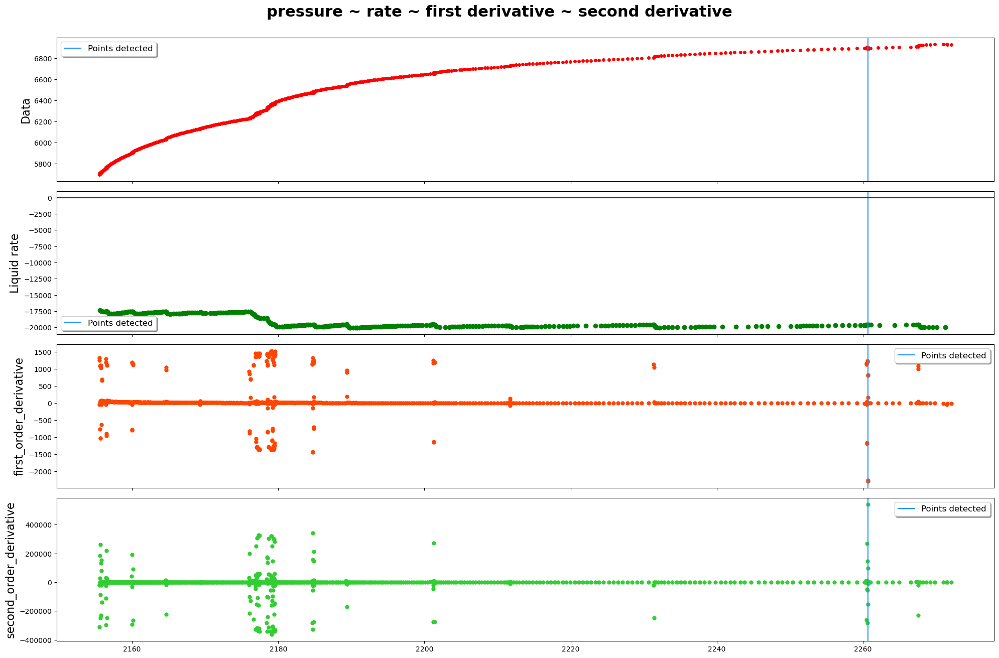

------row 26-----detected points:[17561, 17589, 17590]


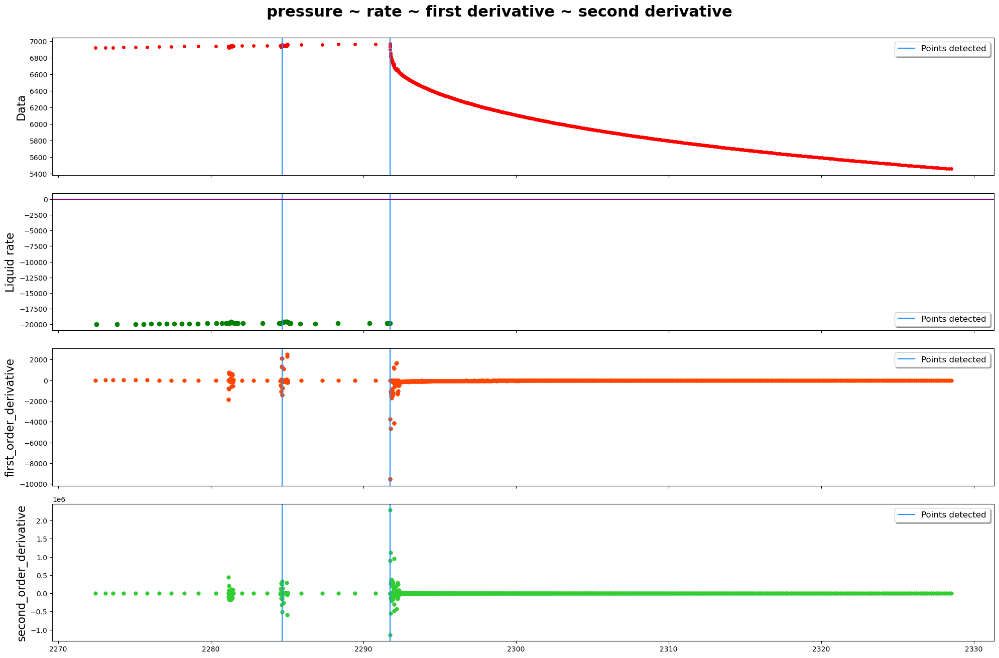

------row 27-----detected points:[18436, 18437, 18468, 18815, 18820, 18821, 18823, 18824, 18826, 18827, 18830, 18836, 18847, 18849]


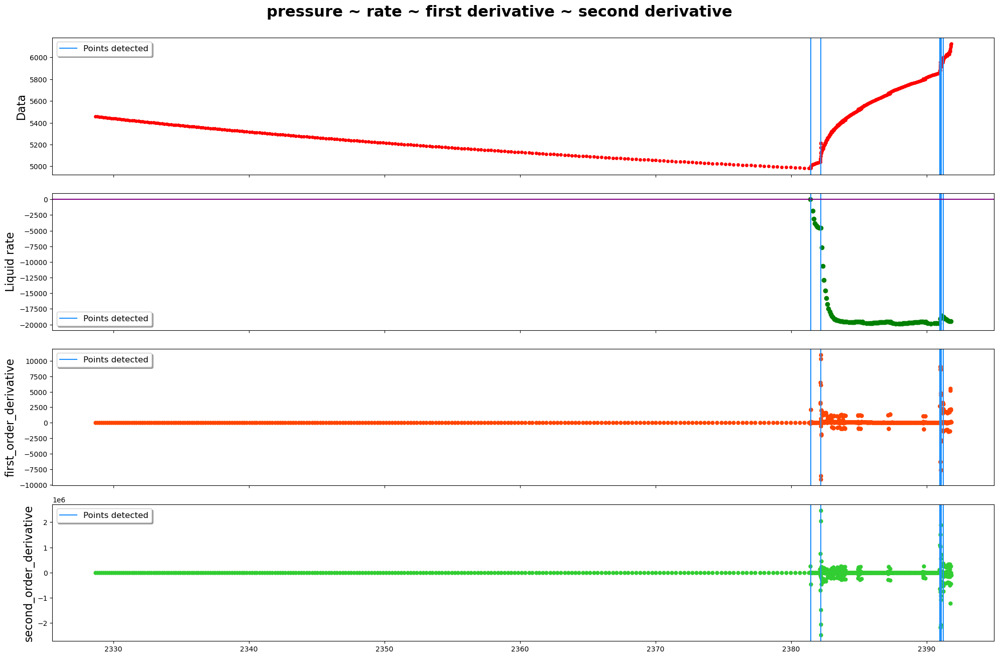

------row 28-----detected points:[]


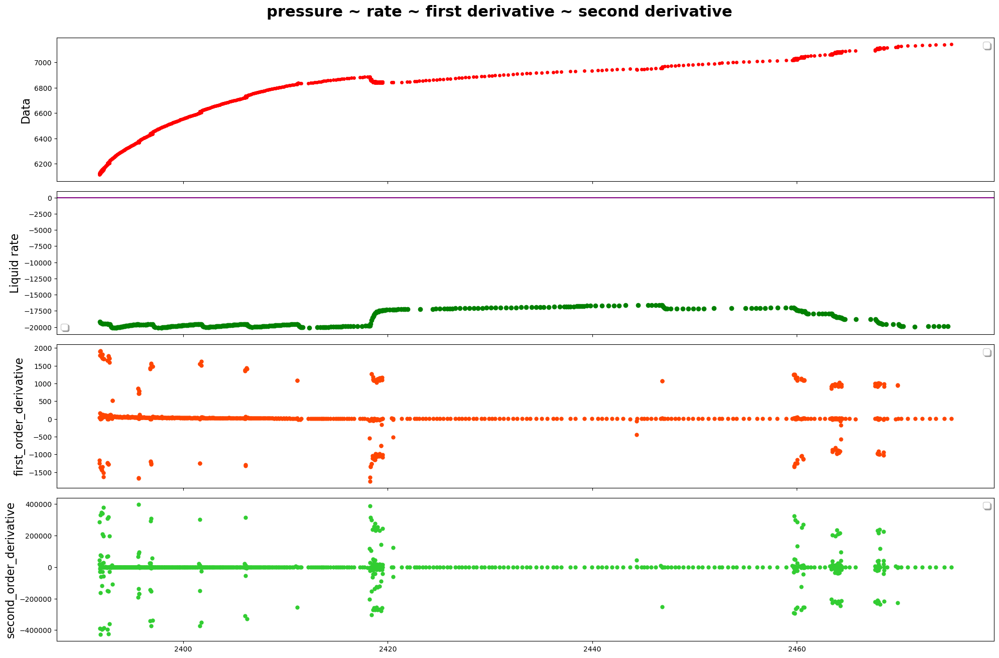

------row 29-----detected points:[19643]


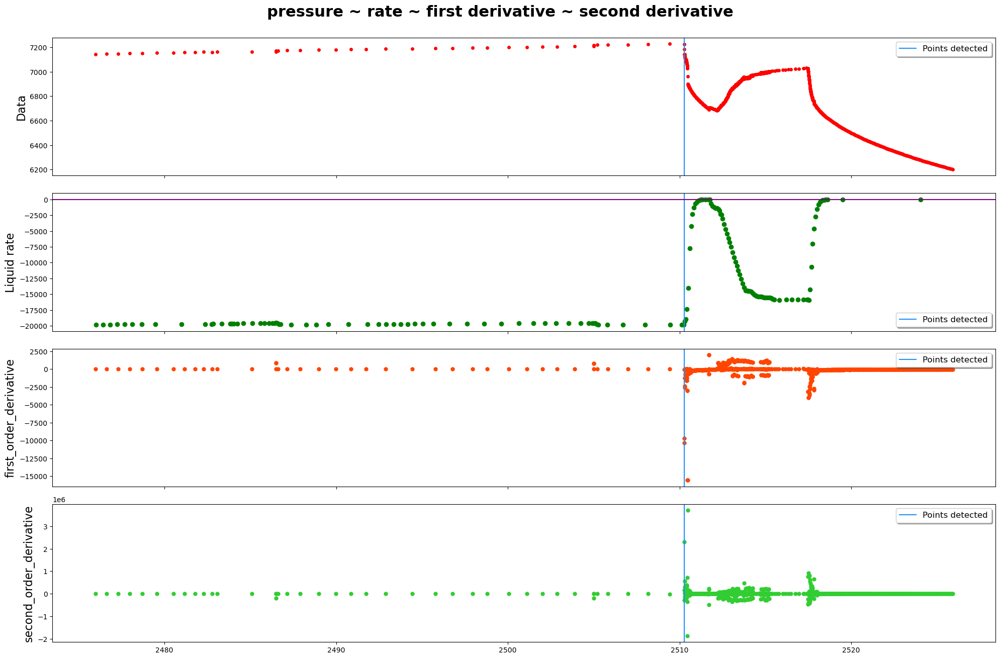

------row 30-----detected points:[20362, 20701]


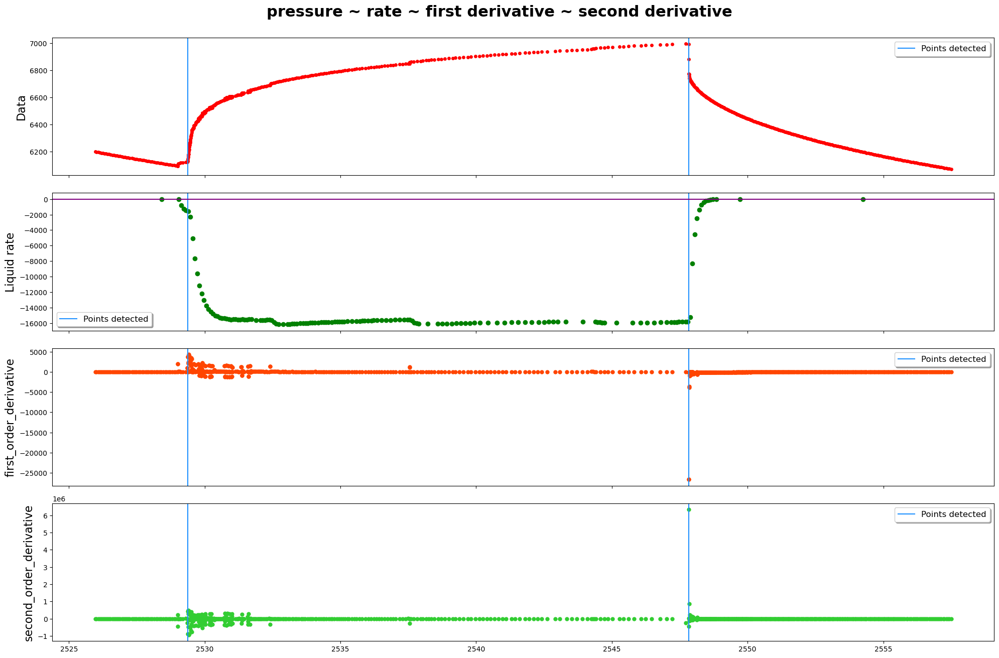

------row 31-----detected points:[]


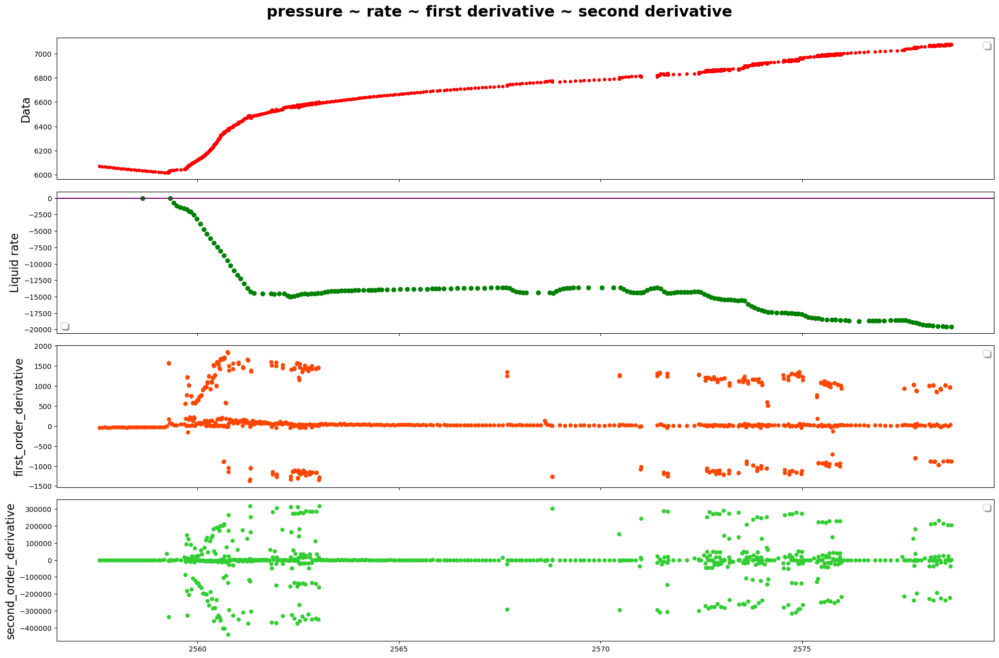

------row 32-----detected points:[21974, 22183]


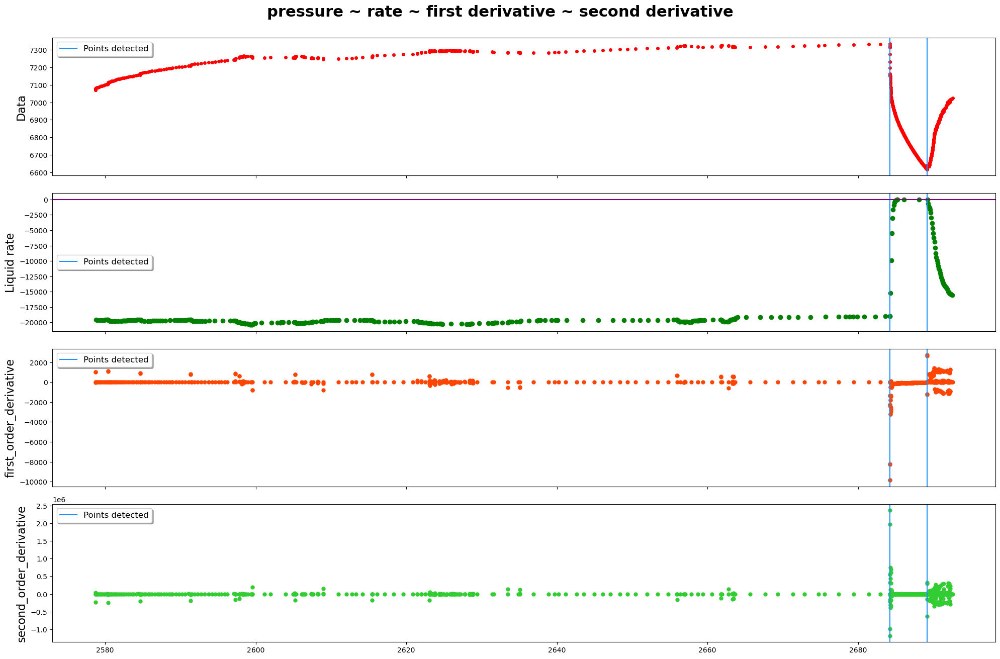

------row 33-----detected points:[22710]


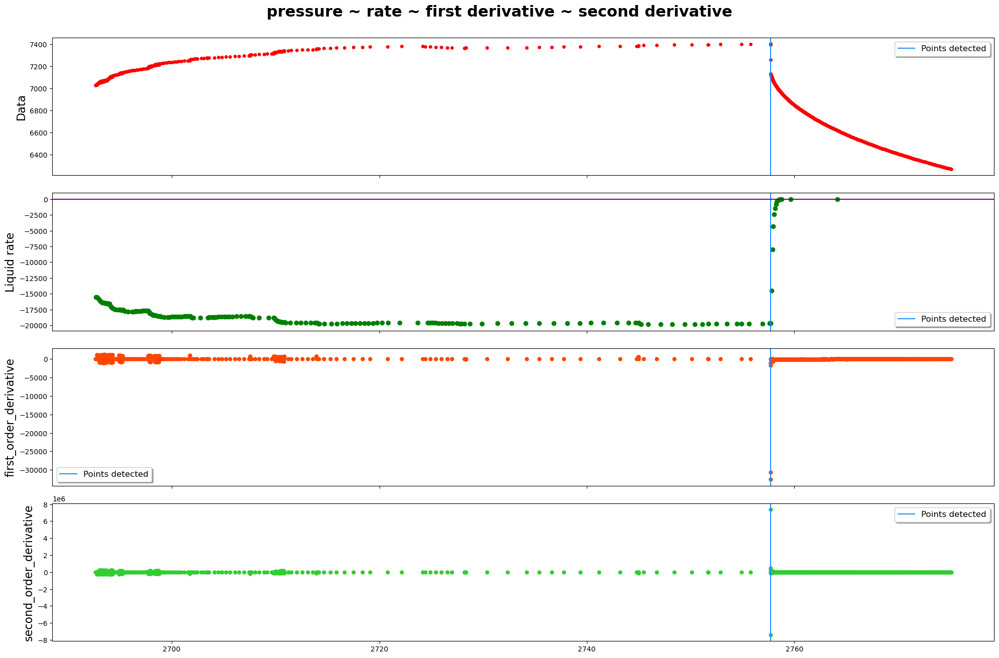

------row 34-----detected points:[]


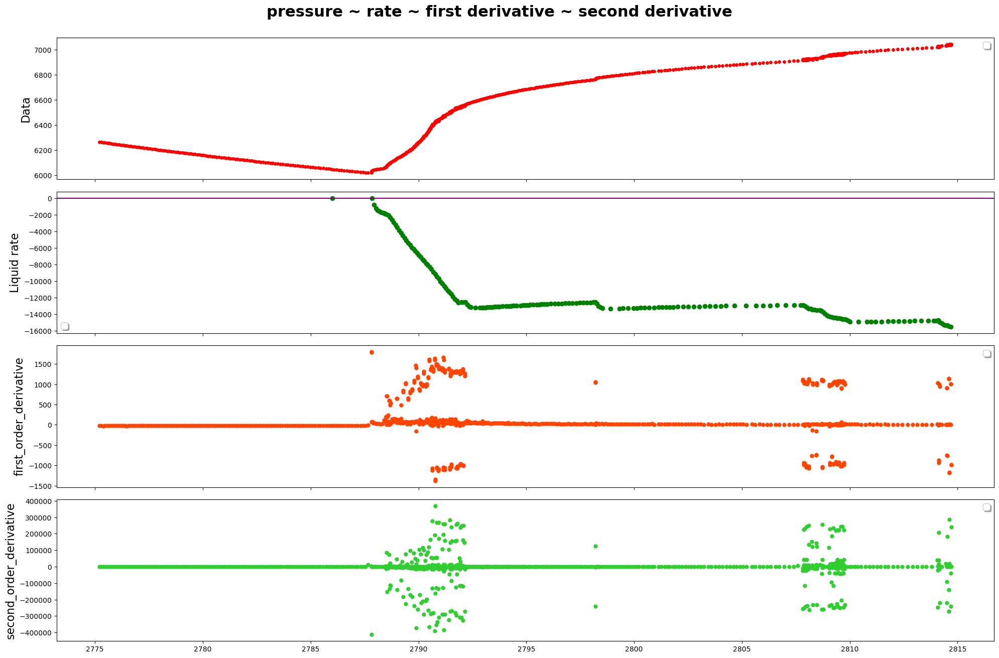

------row 35-----detected points:[24130, 24132, 24215, 24216, 24263, 24264]


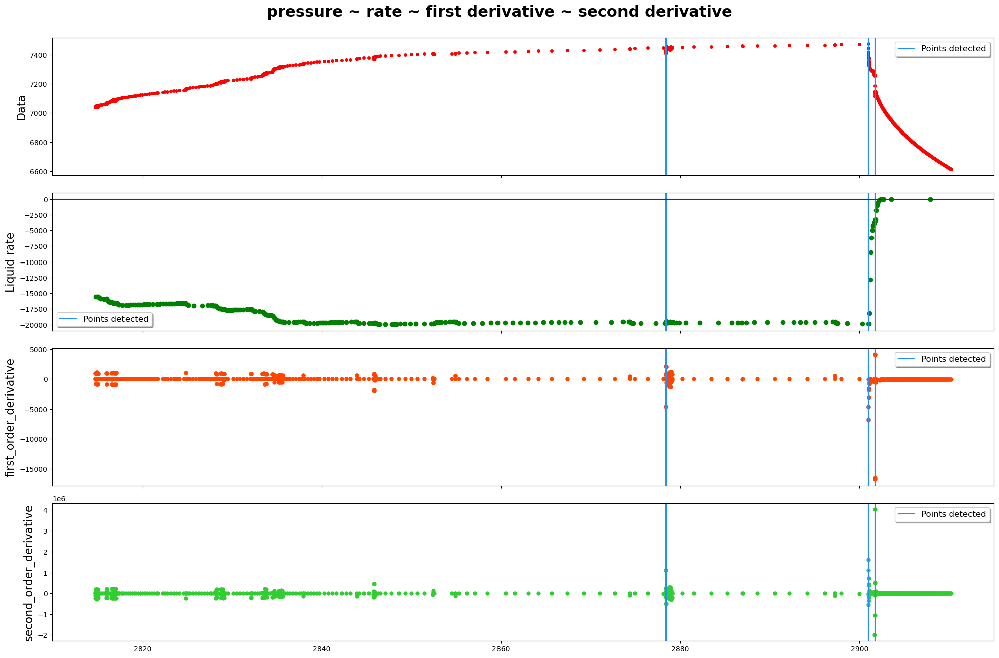

------row 36-----detected points:[24793]


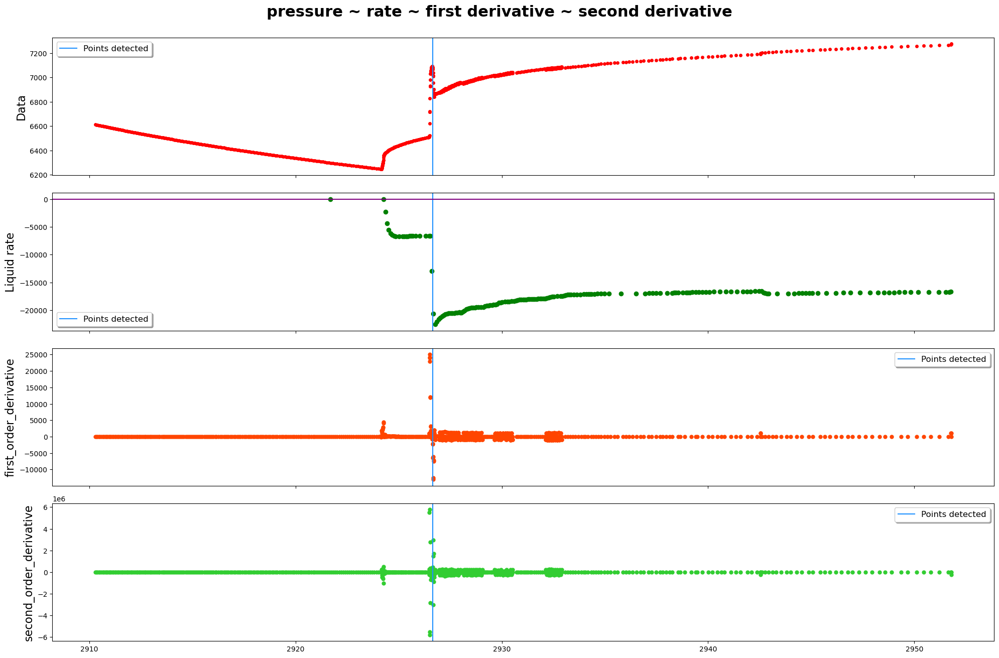

------row 37-----detected points:[]


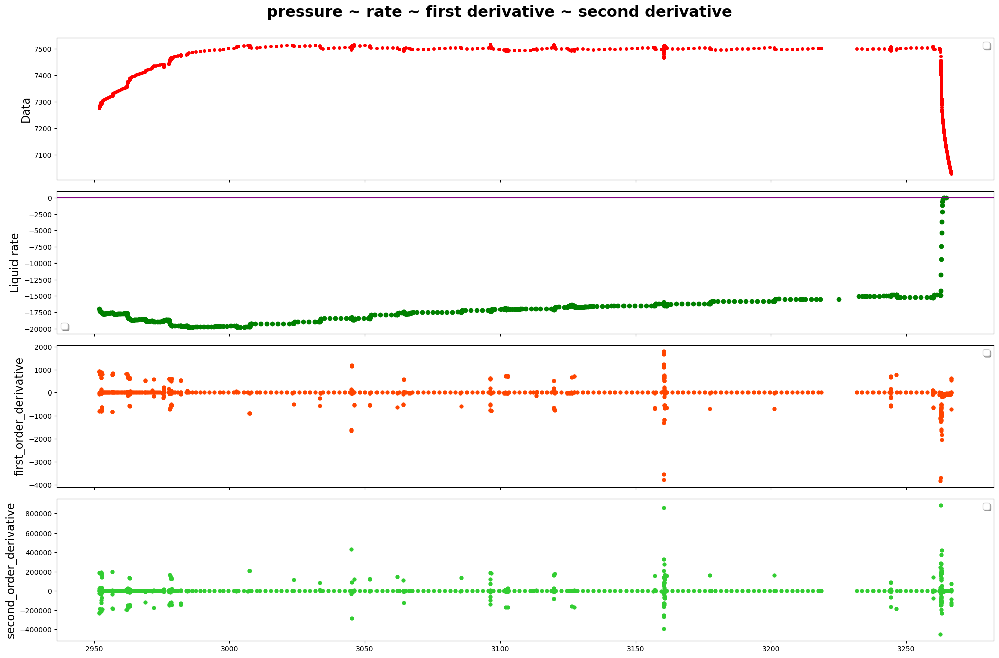

------row 38-----detected points:[26016, 26432, 26504]


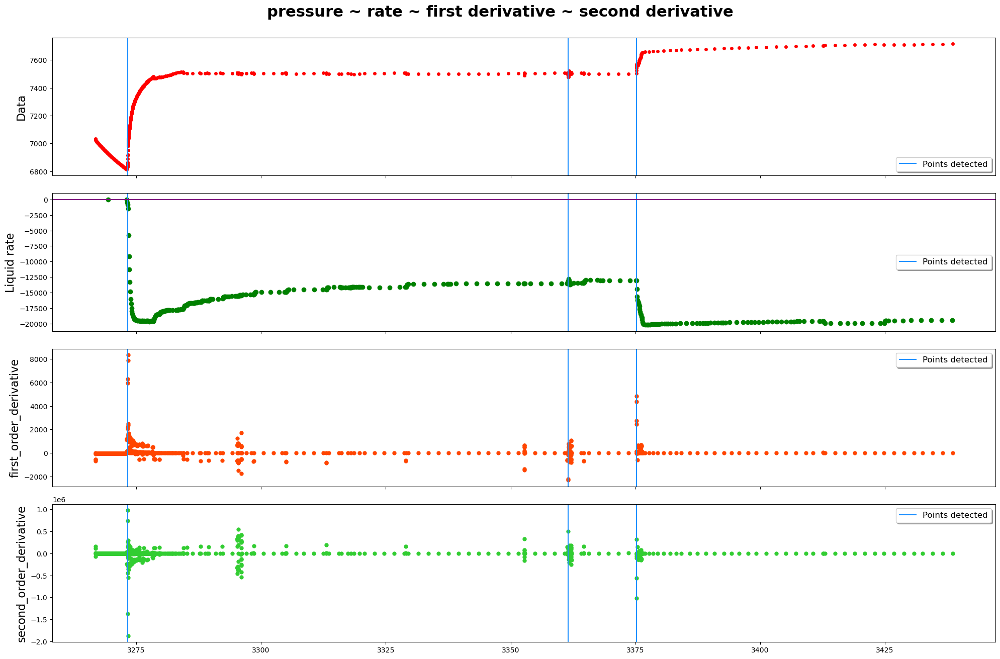

------row 39-----detected points:[26656, 26783, 27023]


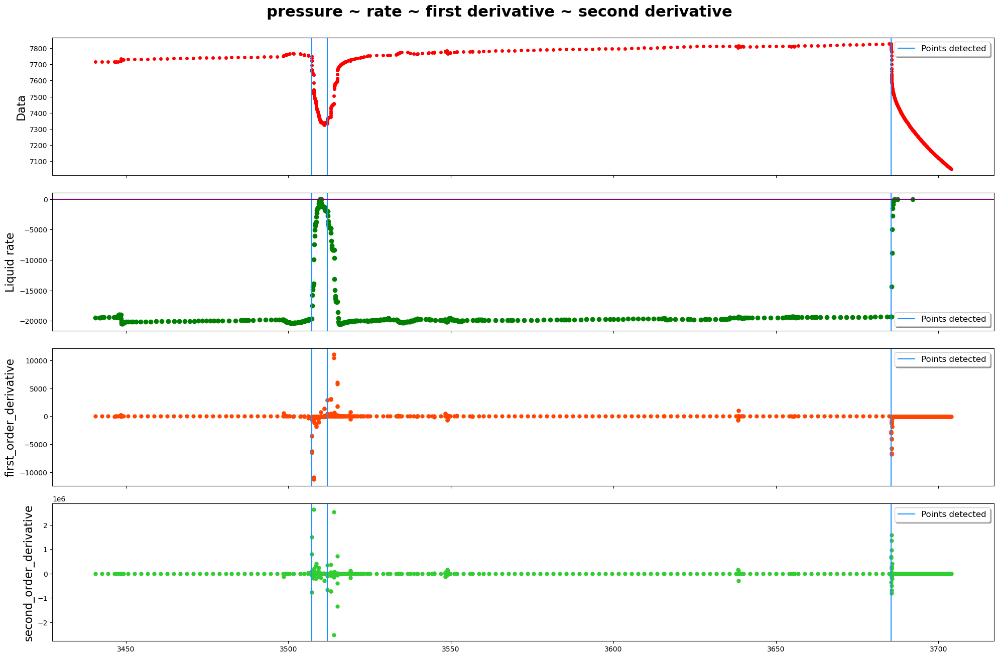

------row 40-----detected points:[27316, 27319, 27962, 27963, 27966]


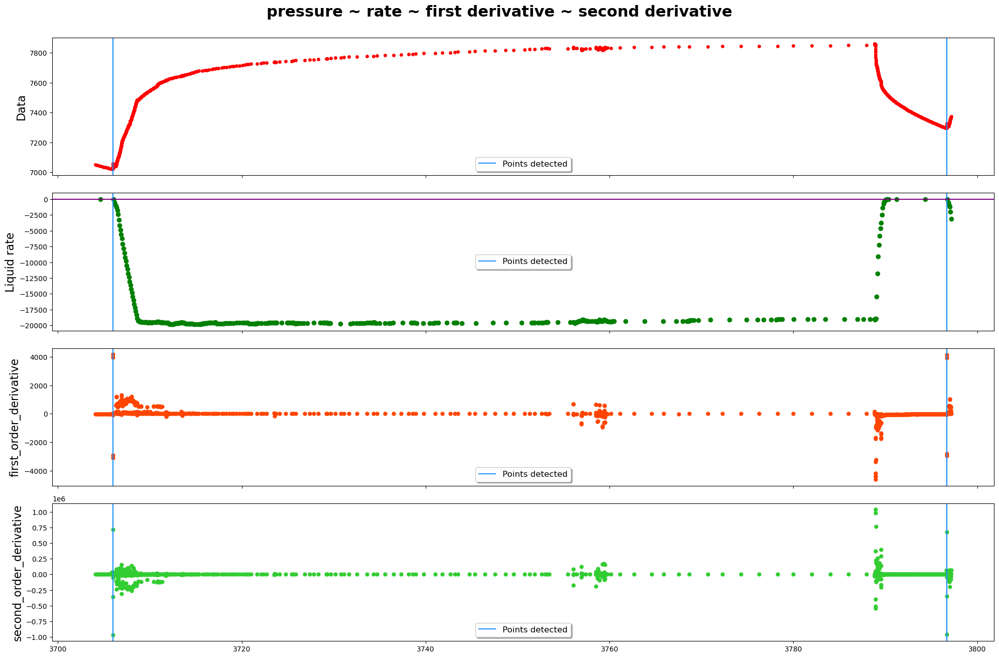

------row 41-----detected points:[28243, 28263, 28290, 28300, 28310]


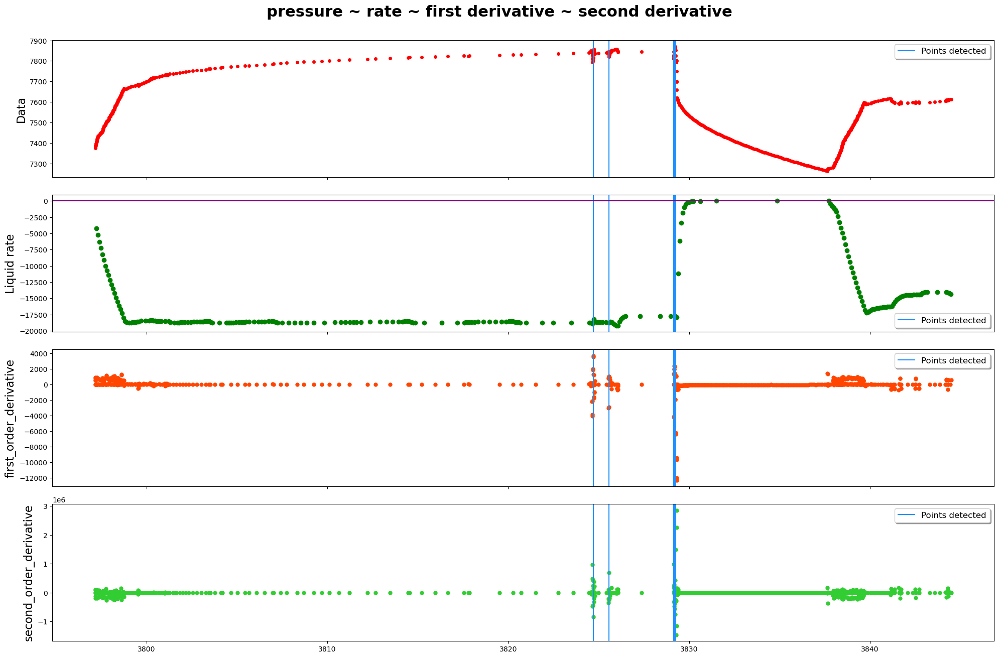

------row 42-----detected points:[29122]


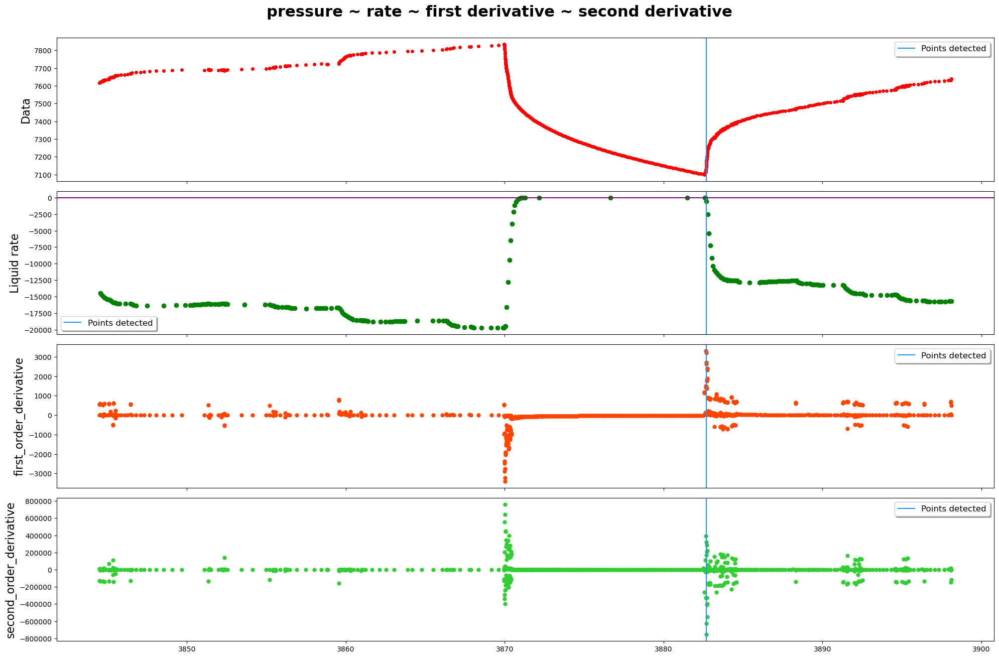

------row 43-----detected points:[29484, 29547, 29553]


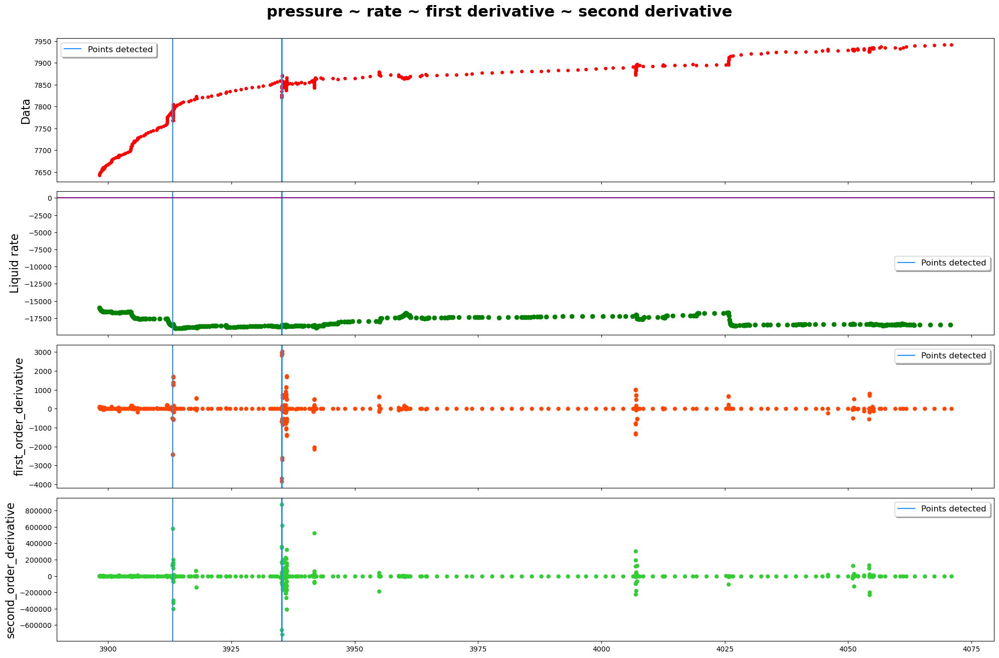

In [16]:
#baseline method
data_inOneRow=700
plot_4_metrics_details(data_inOneRow,
                       pressure_df,
                       rate_df,
                       breakpoints_detected_3,
                       ground_truth,
                       colum_names)

**S-G filter**

std_1:217.076859984311,std_2:26067.263415502584


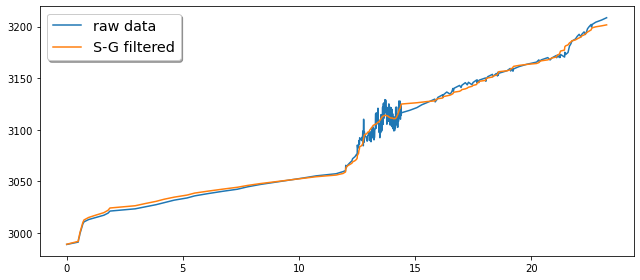

In [17]:
#denosing using S-G filter
pressure_df,rate_df,pressure_rate=load_data_from_txt(pressure_file, rate_file)
denoised_pressure_data=savgol_filter(pressure_df["Data"],199,3)

data={"Elapsed time":pressure_df["Elapsed time"],"Data":denoised_pressure_data}
pressure_df_denoised=pd.DataFrame(data=data)
pressure_df_denoised=produce_pressure_4metrics(pressure_df_denoised,colum_names)
# display(pressure_df_denoised)
first_order_derivative=pressure_df_denoised["first_order_derivative"]
second_order_derivative=pressure_df_denoised["second_order_derivative"]
std_1=statistics.stdev(first_order_derivative)
std_2=statistics.stdev(second_order_derivative)
print(f"std_1:{std_1},std_2:{std_2}")

#plot first 700 denoised data
pressure_df_first400=pressure_df.iloc[0:400,:]
fig=plt.figure(figsize=(9,4))
ax=fig.subplots()
p=ax.plot(pressure_df_first400["Elapsed time"],pressure_df_first400["Data"],label='raw data')
p=ax.plot(pressure_df_first400["Elapsed time"],denoised_pressure_data[0:400],label='S-G filtered')
legend = ax.legend(loc='upper left', shadow=True, fontsize='x-large')
# legend.get_frame().set_facecolor('C0')
plt.show()

In [18]:
# #S-G filter startPoint
# noise_threshold=3
# breakpoints_detected_startPoint=detect_breakpoints_startPoint(first_order_derivative,noise_threshold)
# print("len(breakpoints_detected)",len(breakpoints_detected_startPoint))
# plot_4_metrics(pressure_df_denoised,
#                rate_df,
#                breakpoints_detected_startPoint,
#                ground_truth,
#                colum_names)

In [19]:
# data_inOneRow=800
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df_denoised,
#                        rate_df,
#                        breakpoints_detected_startPoint,
#                        ground_truth,
#                        colum_names)

len(breakpoints_detected) 404


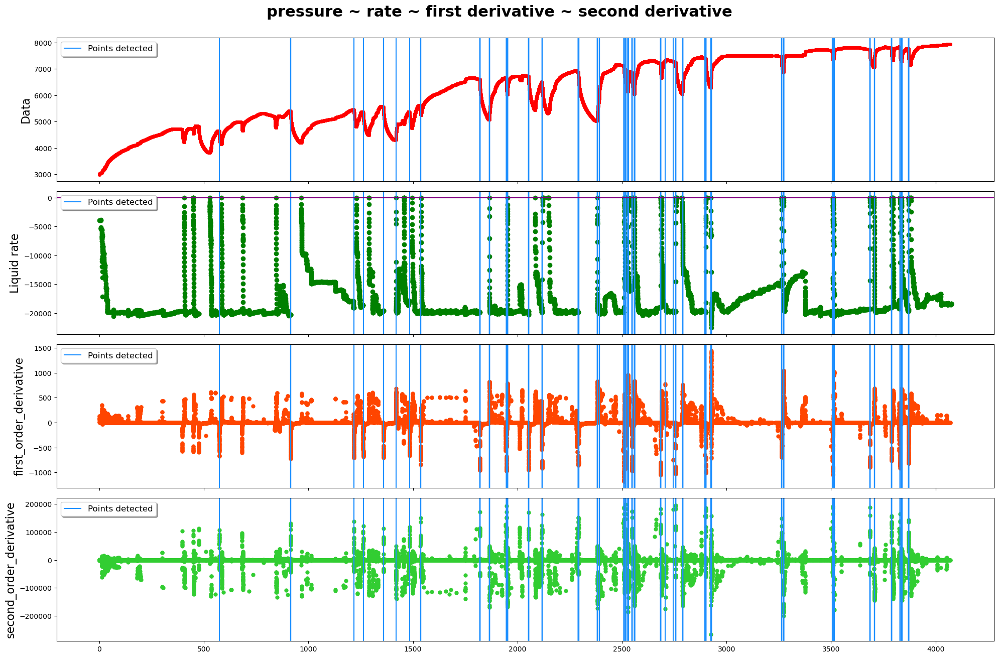

In [20]:
#S-G filter startPoint2
noise_threshold=3
breakpoints_detected_startPoint2=detect_breakpoints_startPoint2(first_order_derivative,second_order_derivative,noise_threshold)
print("len(breakpoints_detected)",len(breakpoints_detected_startPoint2))
plot_4_metrics(pressure_df_denoised,
               rate_df,
               breakpoints_detected_startPoint2,
               ground_truth,
               colum_names)

217.076859984311 26067.263415502584
69


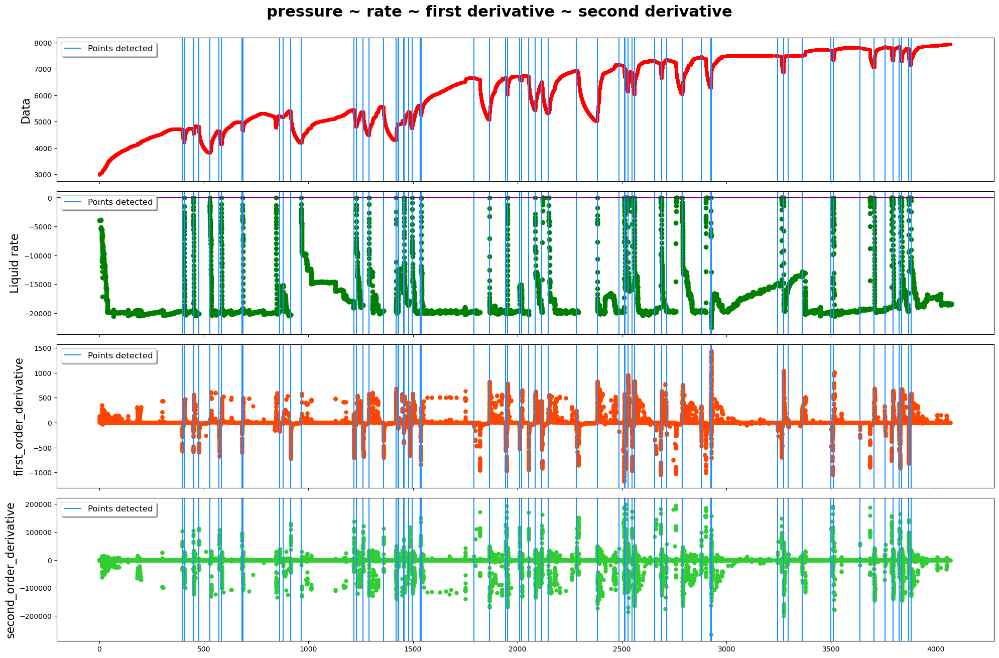

In [21]:
#S-G filter detect algorithm 3
noise_threshold=0.3
breakpoints_detected_3SG=detect_breakpoints_3(first_order_derivative,second_order_derivative,noise_threshold)
print(len(breakpoints_detected_3SG))
plot_4_metrics(pressure_df_denoised,
               rate_df,
               breakpoints_detected_3SG,
               ground_truth,
               colum_names)

detected 69 points as breakpoints
The plot is devided into 43 rows
------row 1-----detected points:[]


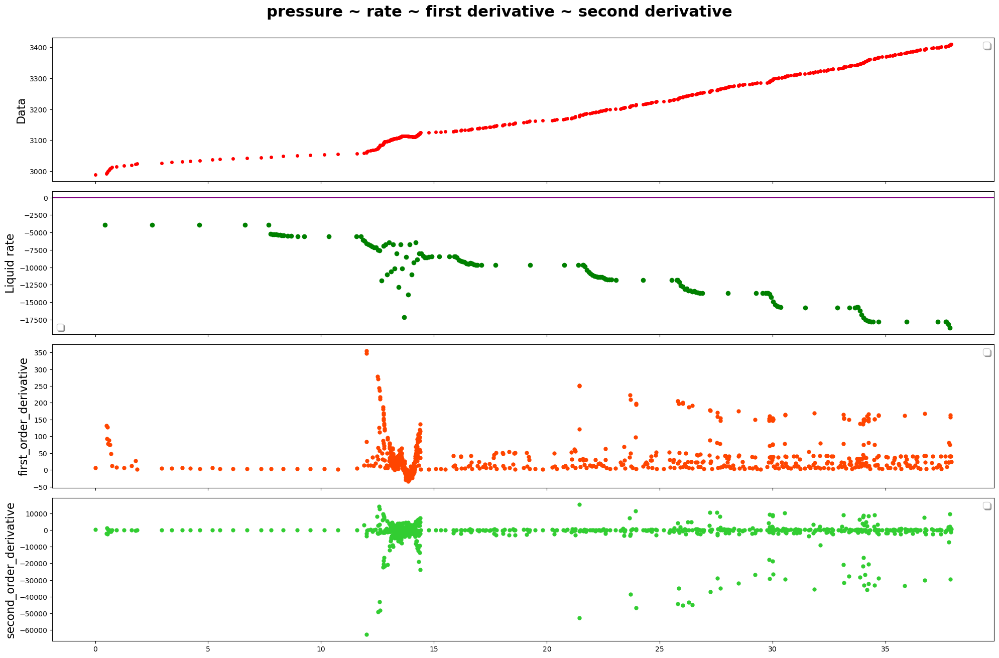

------row 2-----detected points:[]


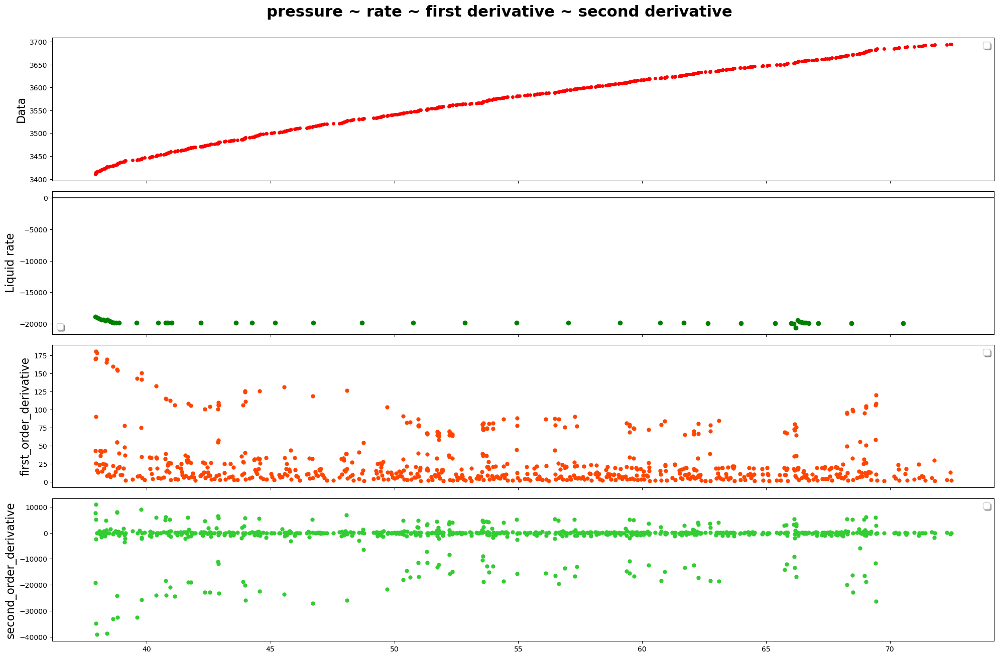

------row 3-----detected points:[]


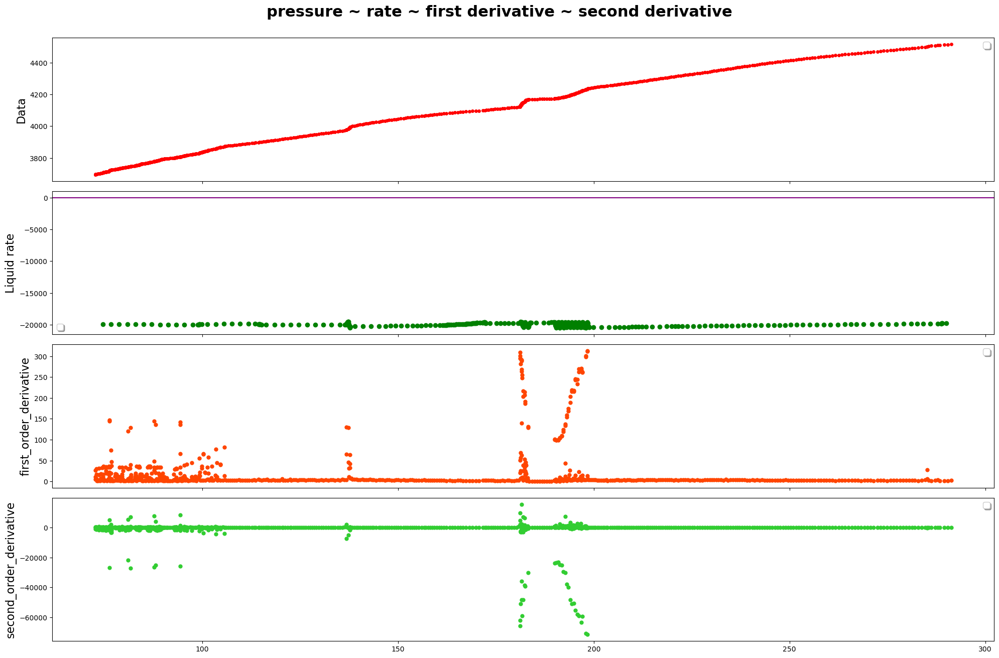

------row 4-----detected points:[2249, 2479]


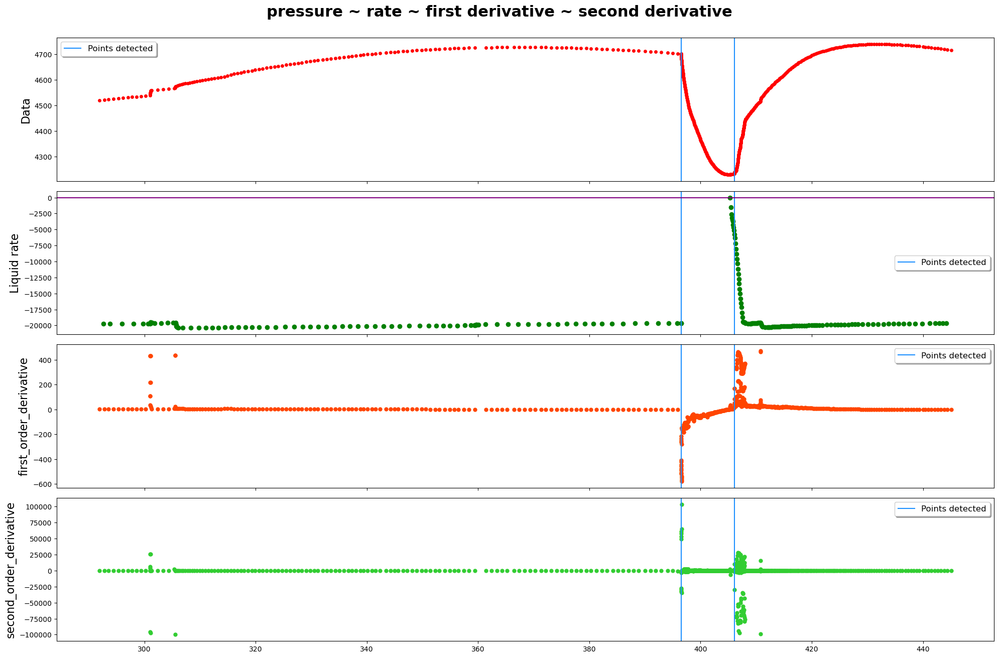

------row 5-----detected points:[2805, 2893, 3100]


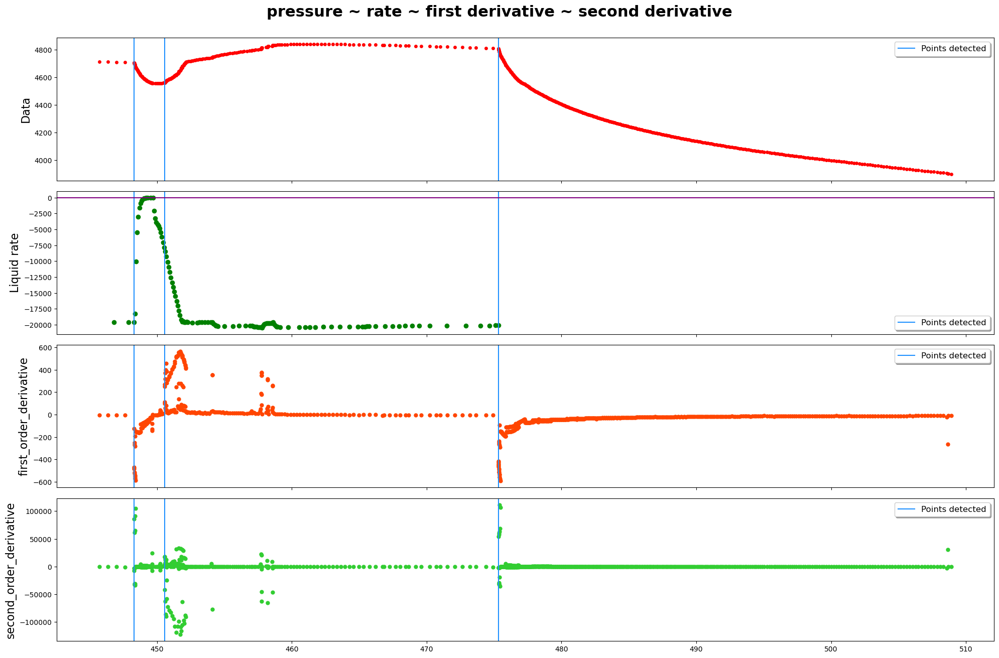

------row 6-----detected points:[3561, 3994]


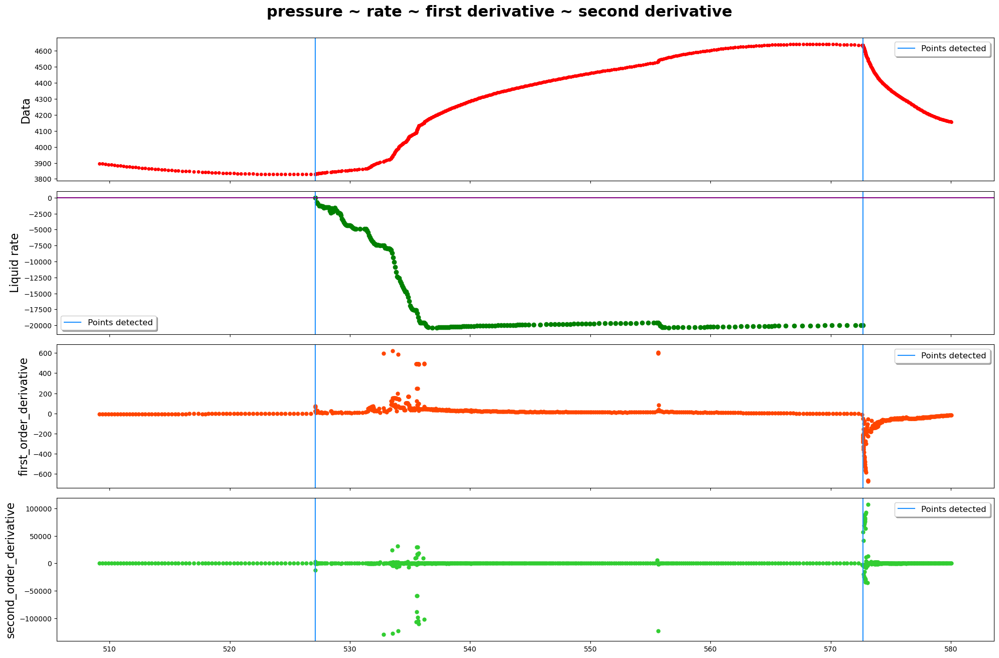

------row 7-----detected points:[4232, 4753, 4899]


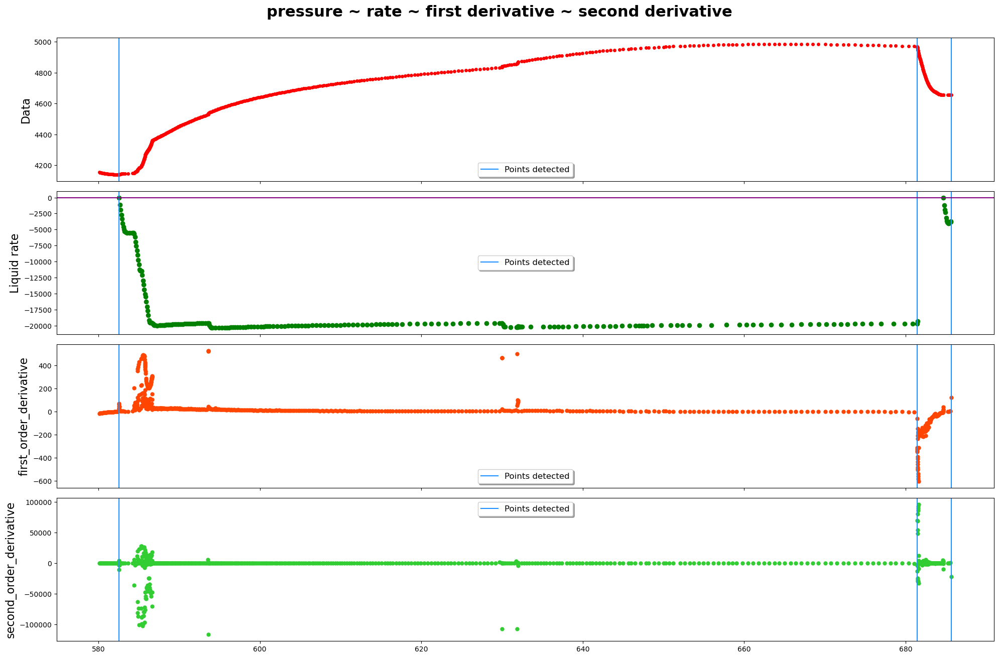

------row 8-----detected points:[]


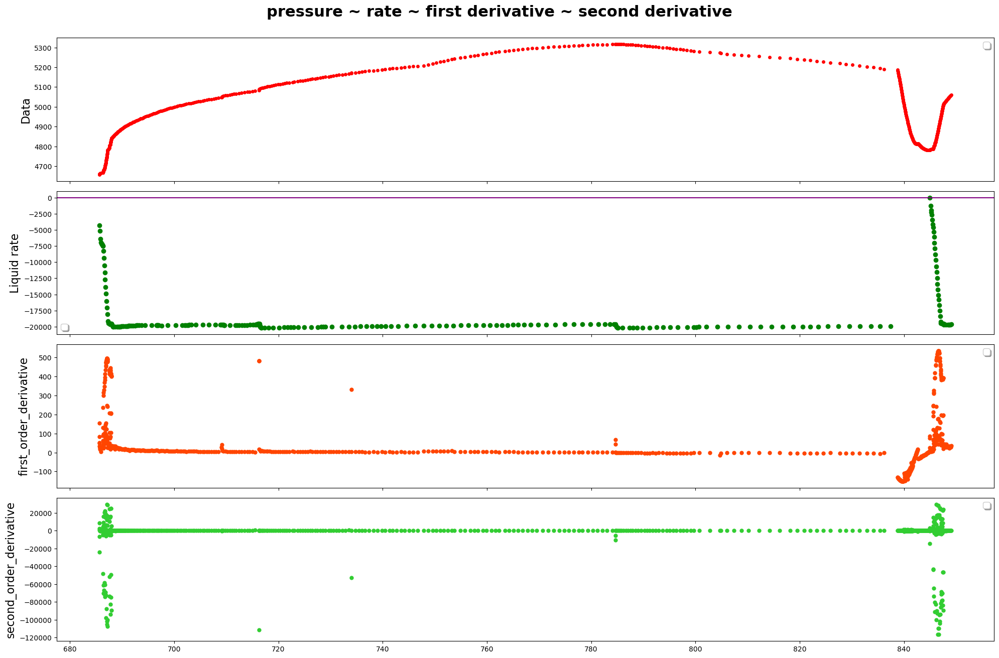

------row 9-----detected points:[5696, 5786, 5984]


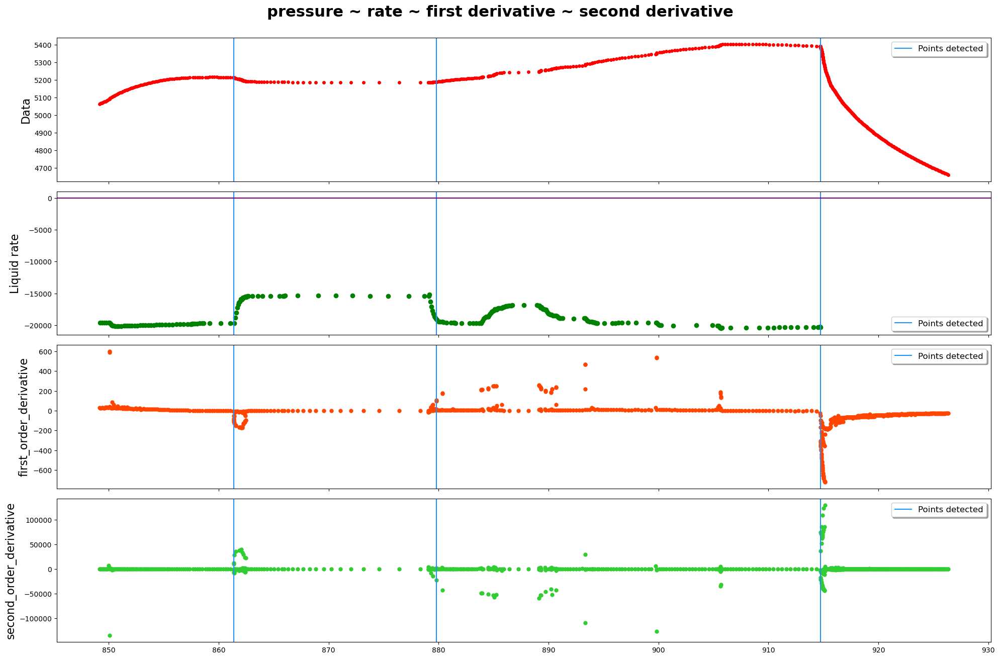

------row 10-----detected points:[6547]


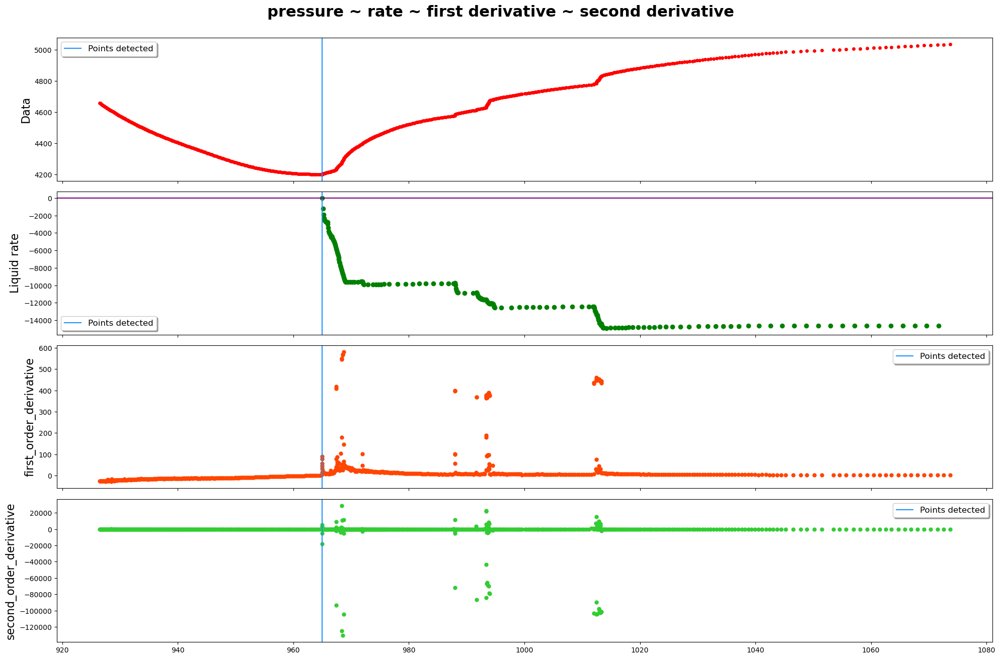

------row 11-----detected points:[7249, 7545]


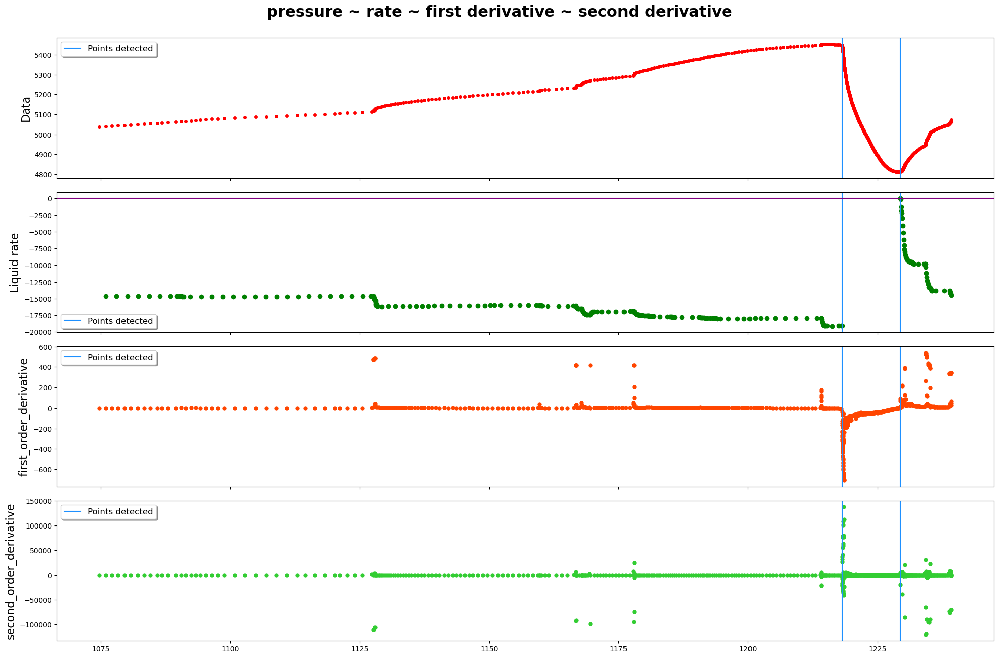

------row 12-----detected points:[7946, 8362]


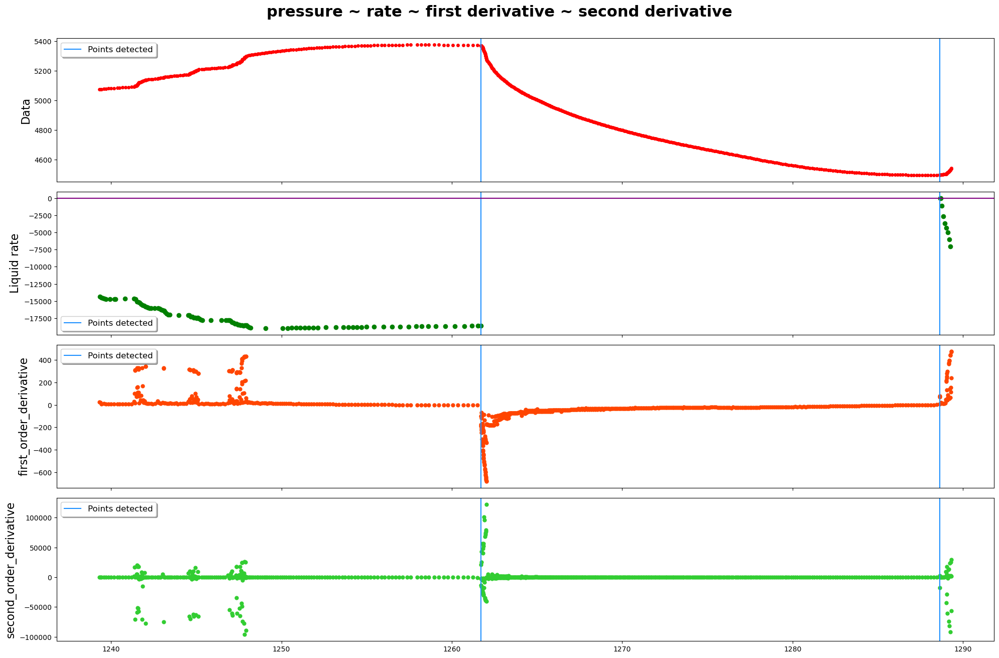

------row 13-----detected points:[9025]


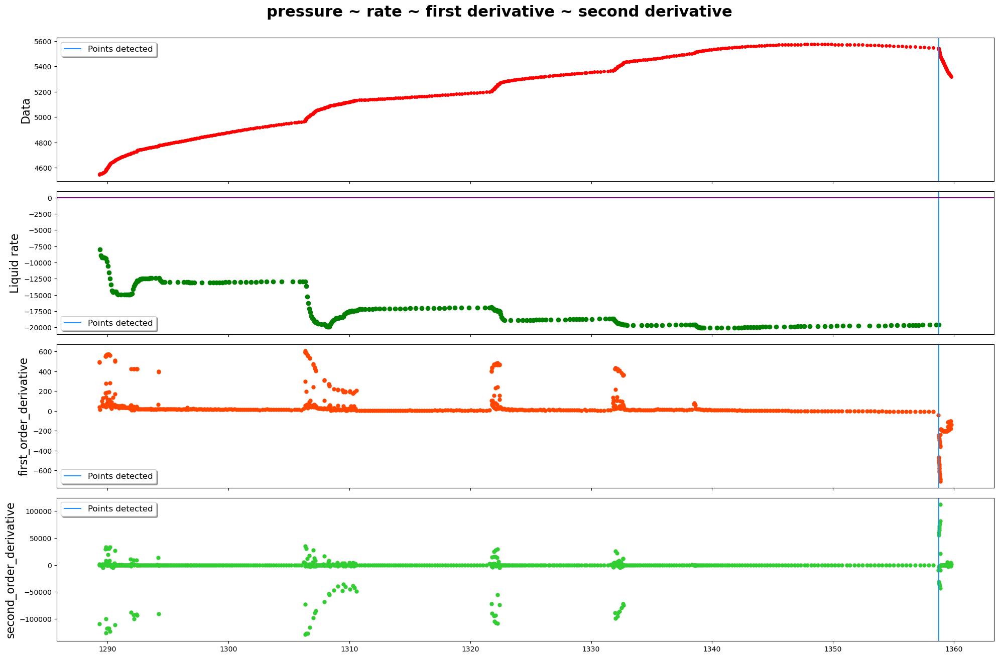

------row 14-----detected points:[9608]


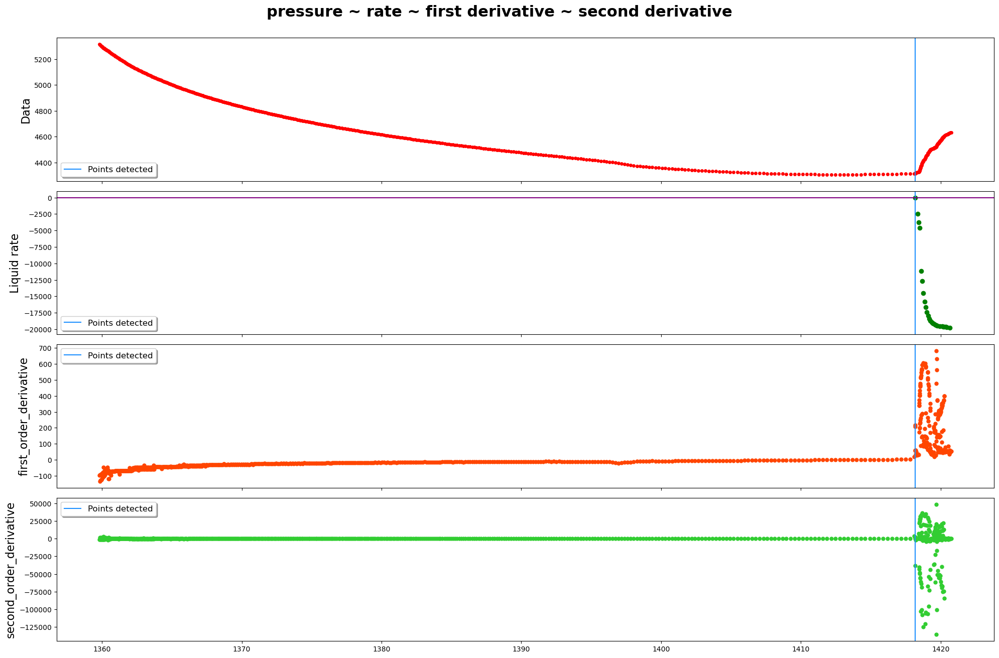

------row 15-----detected points:[9961, 10021, 10149, 10245, 10499]


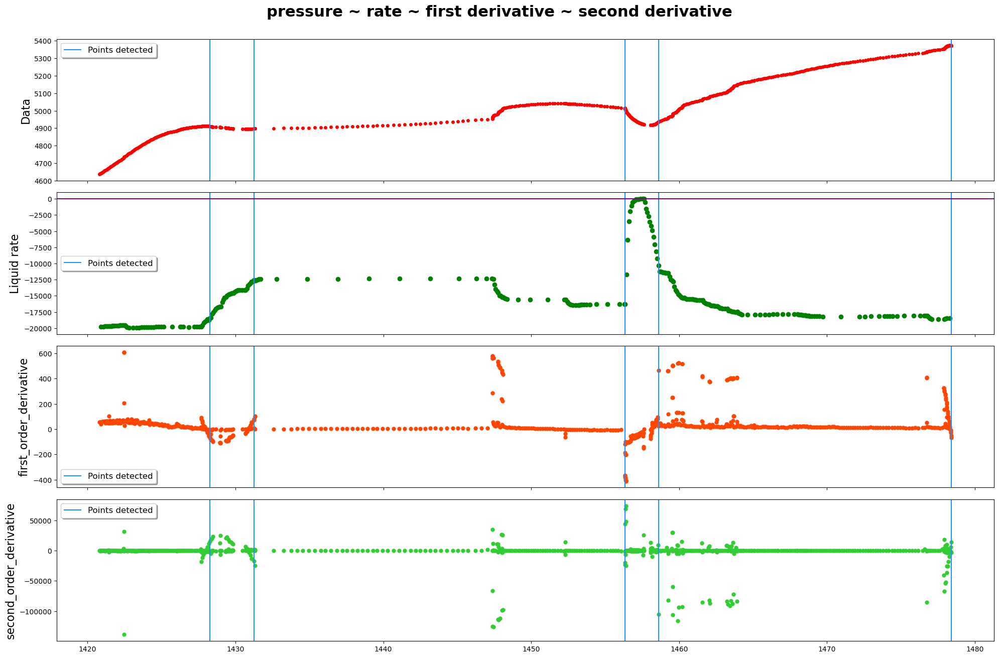

------row 16-----detected points:[10804]


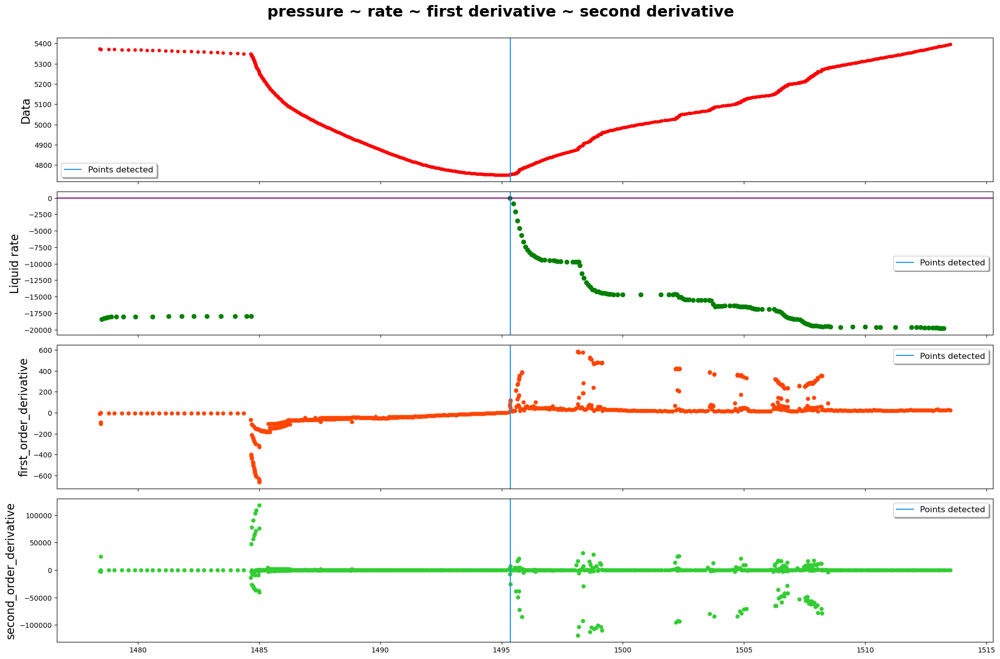

------row 17-----detected points:[11326, 11492]


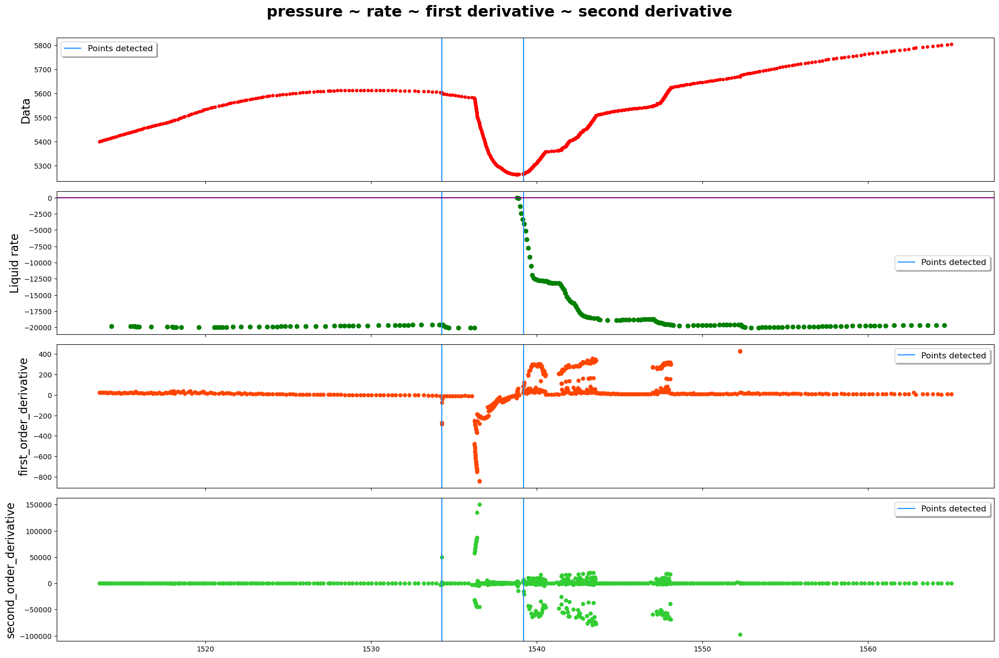

------row 18-----detected points:[12321]


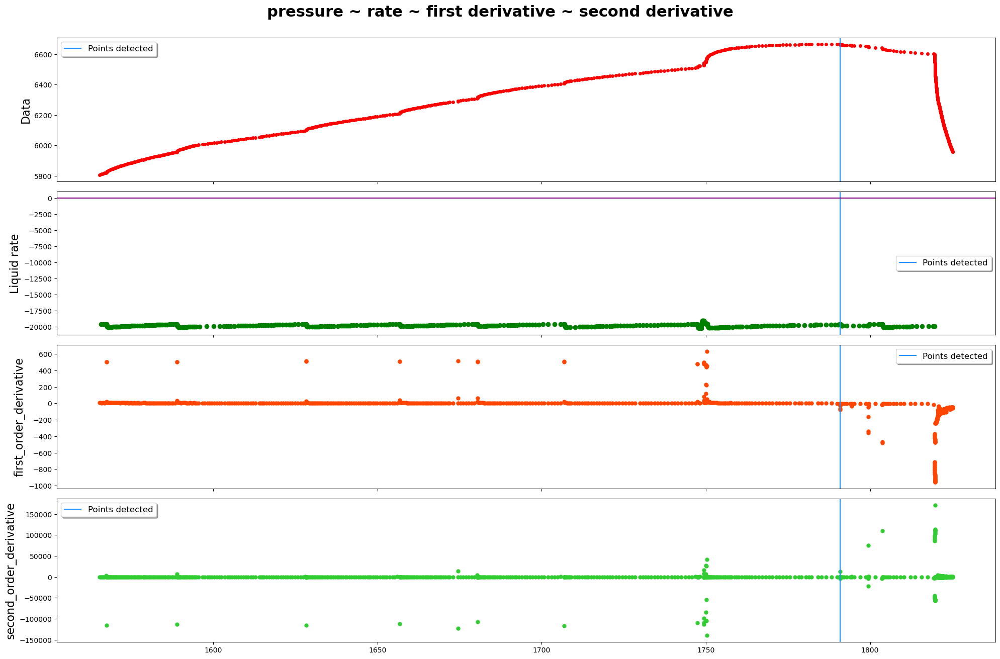

------row 19-----detected points:[13040]


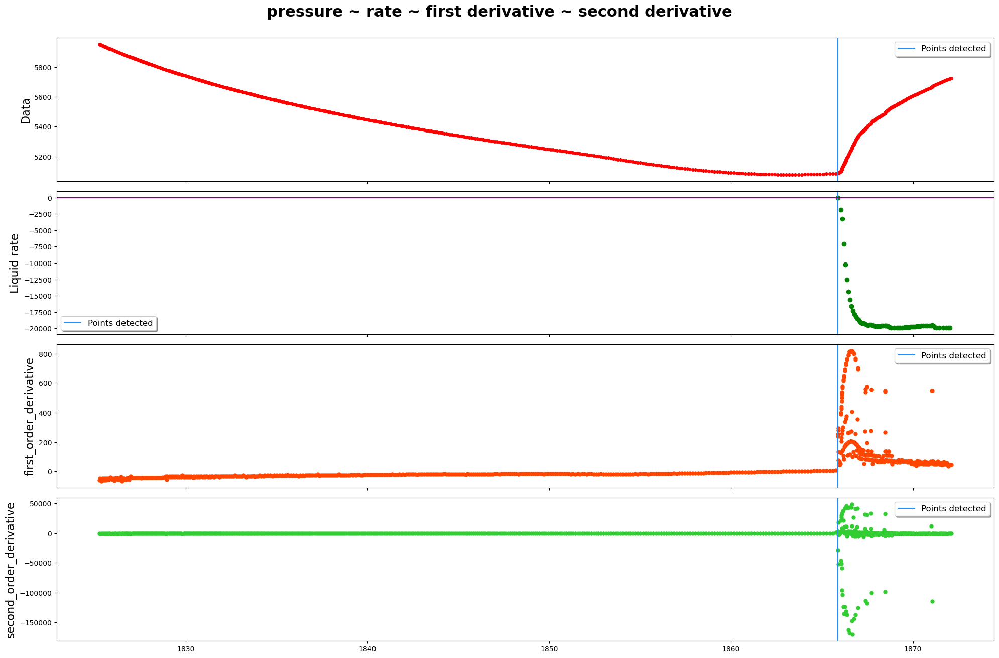

------row 20-----detected points:[13829]


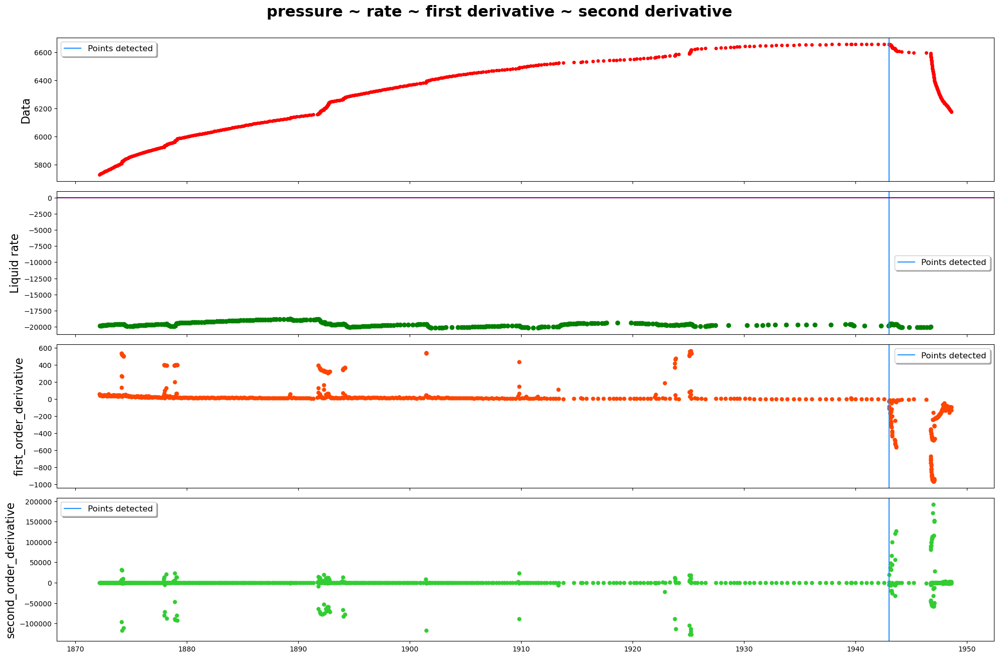

------row 21-----detected points:[14086, 14438, 14576]


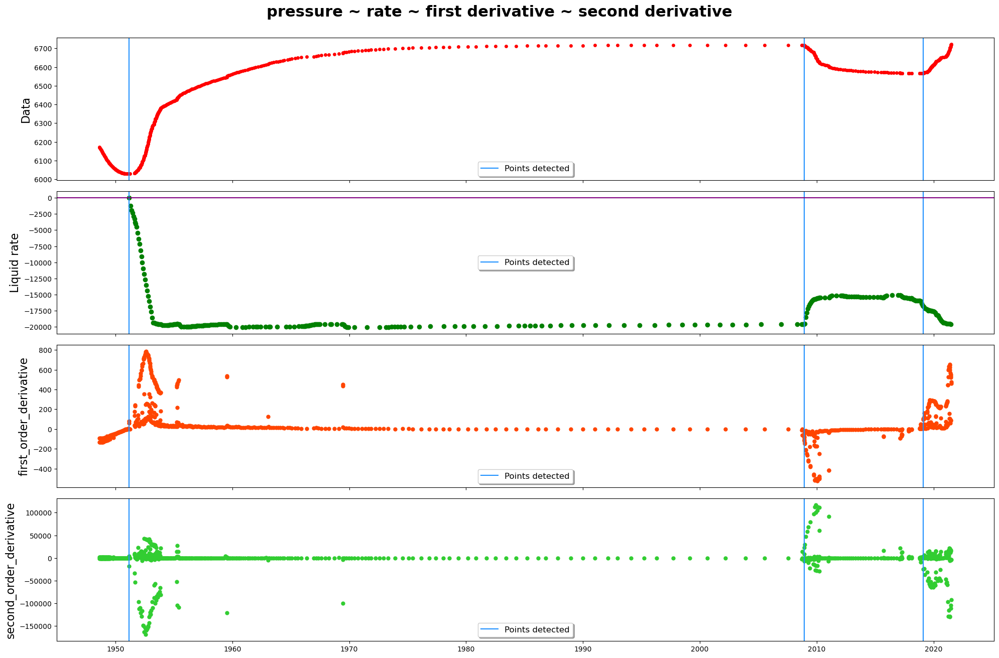

------row 22-----detected points:[14766, 15348]


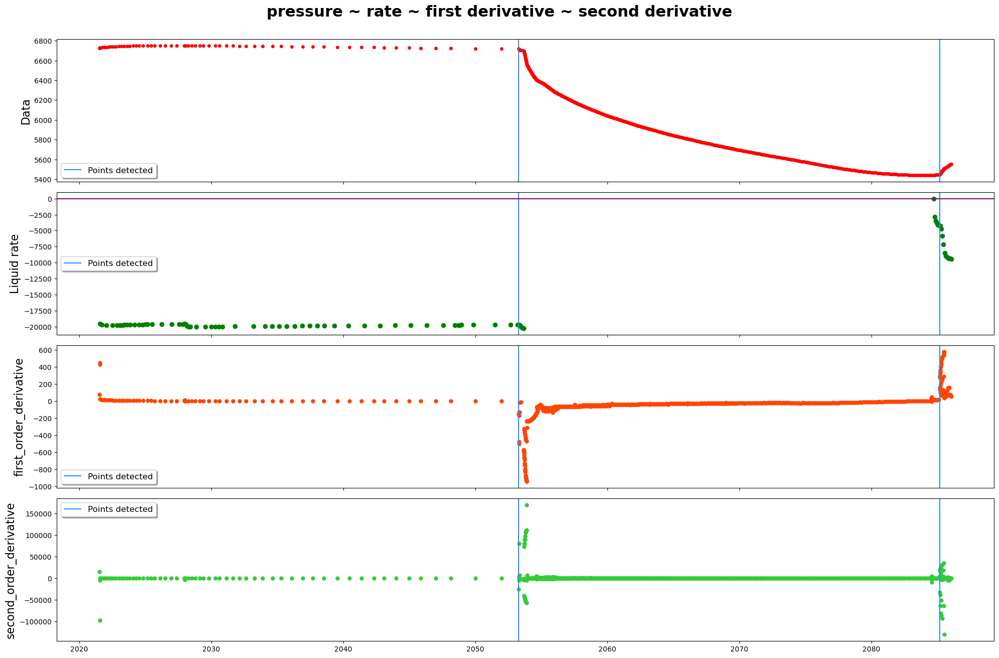

------row 23-----detected points:[16046]


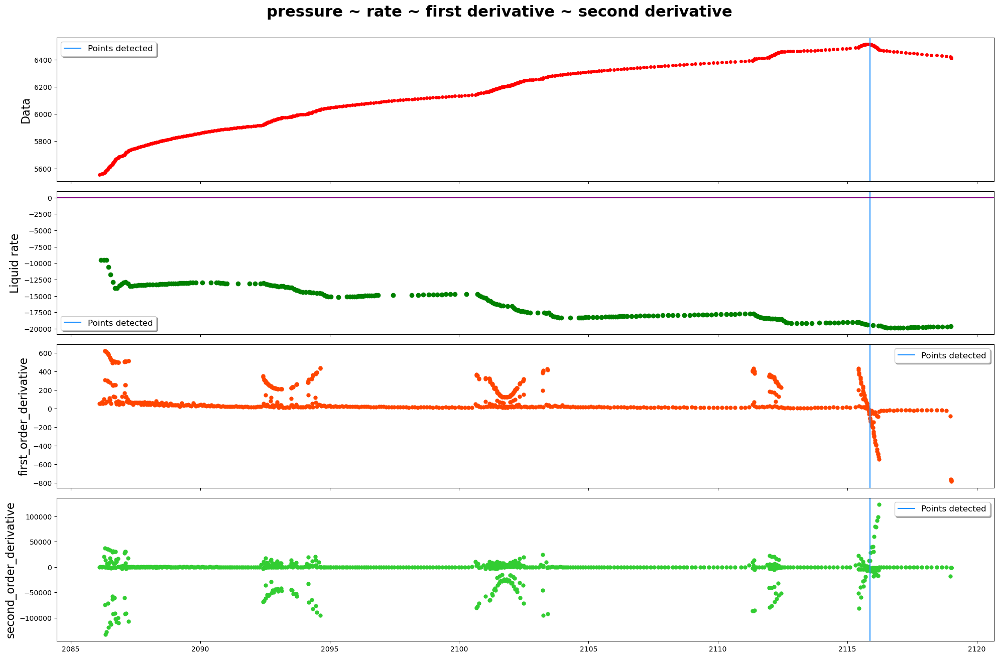

------row 24-----detected points:[16586]


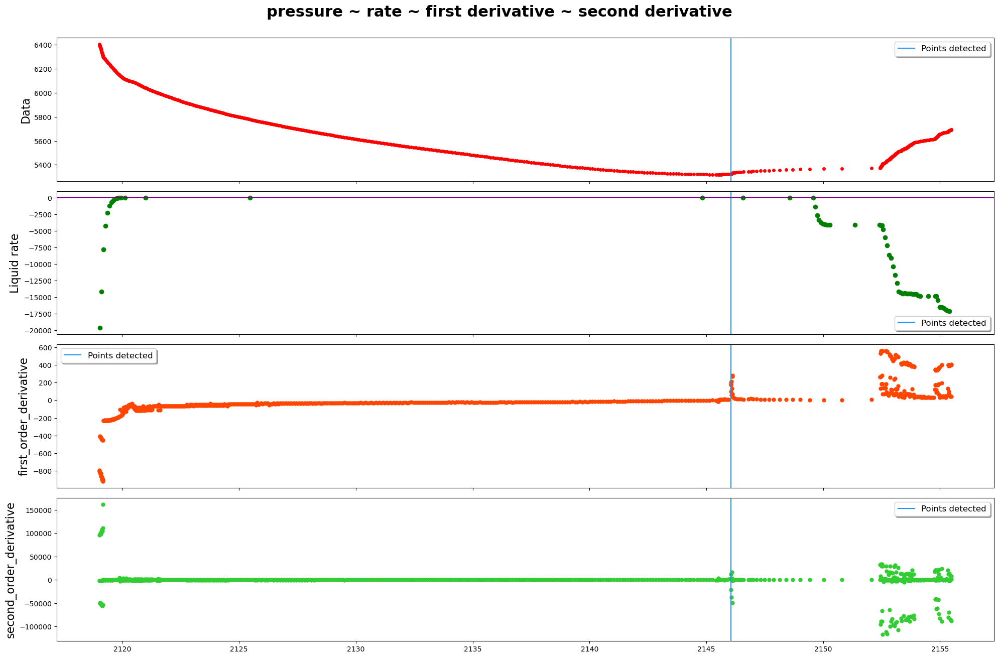

------row 25-----detected points:[]


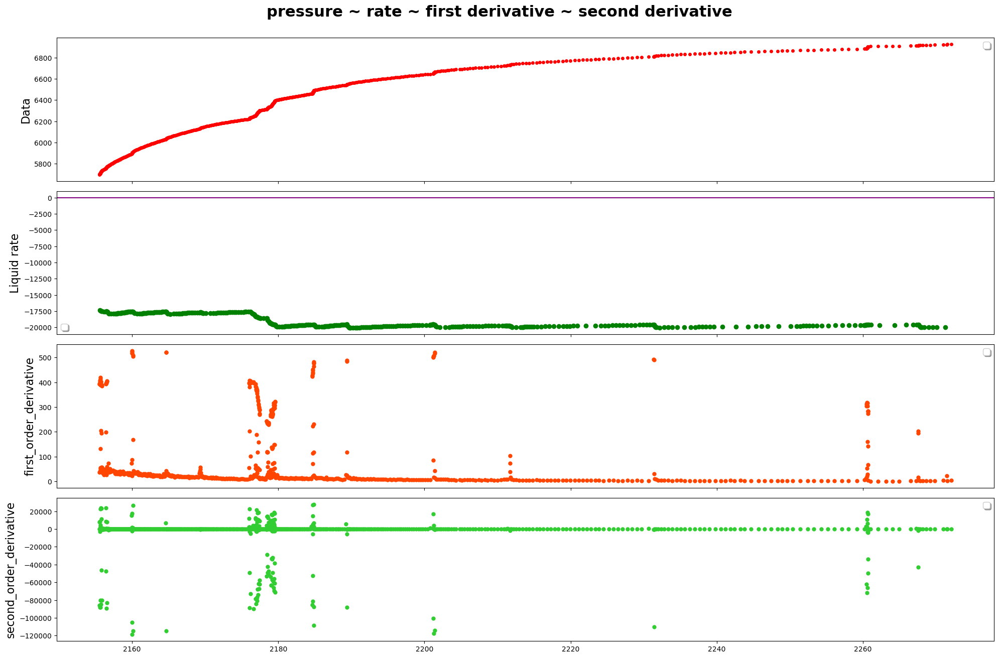

------row 26-----detected points:[17538]


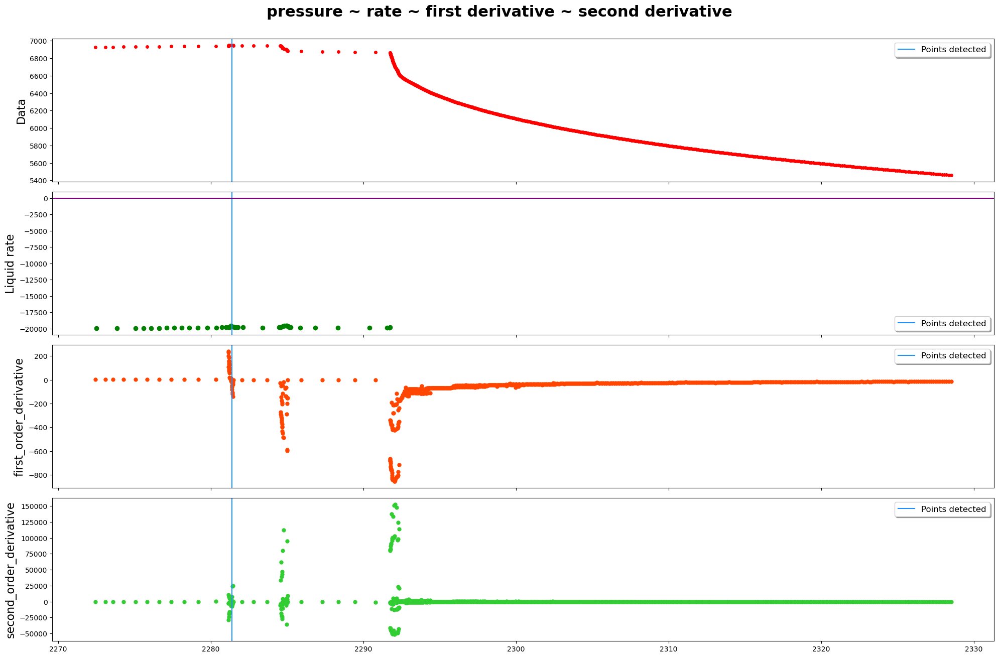

------row 27-----detected points:[18435]


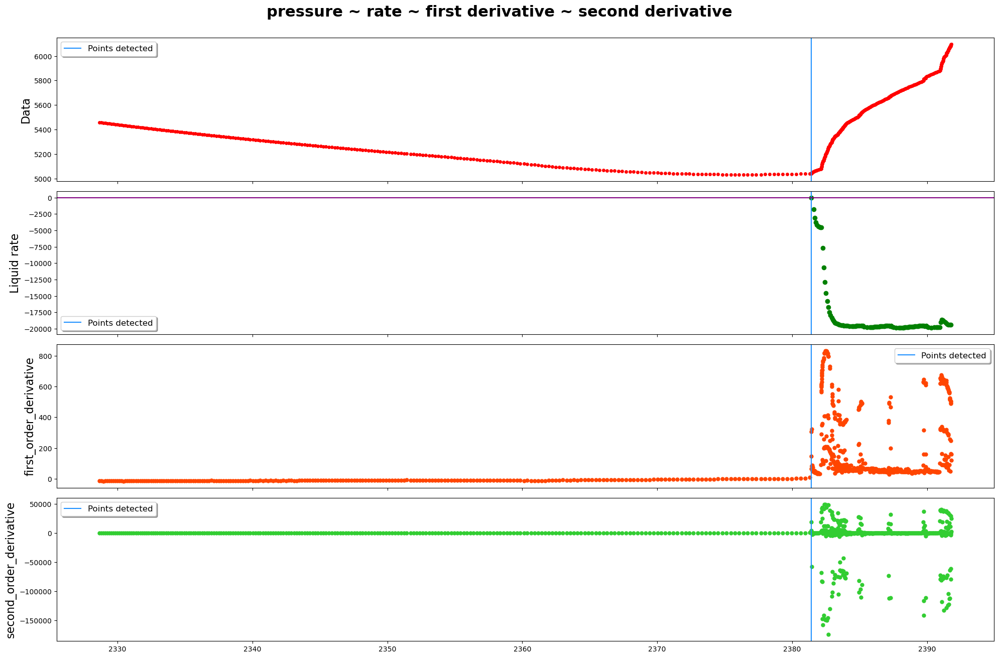

------row 28-----detected points:[]


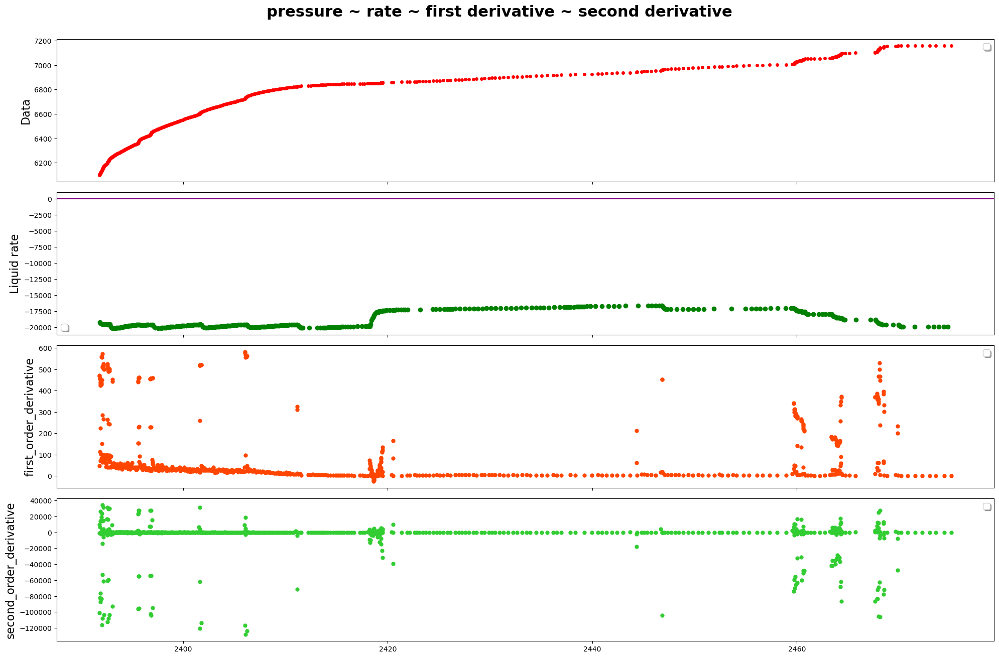

------row 29-----detected points:[19614, 19780, 19976]


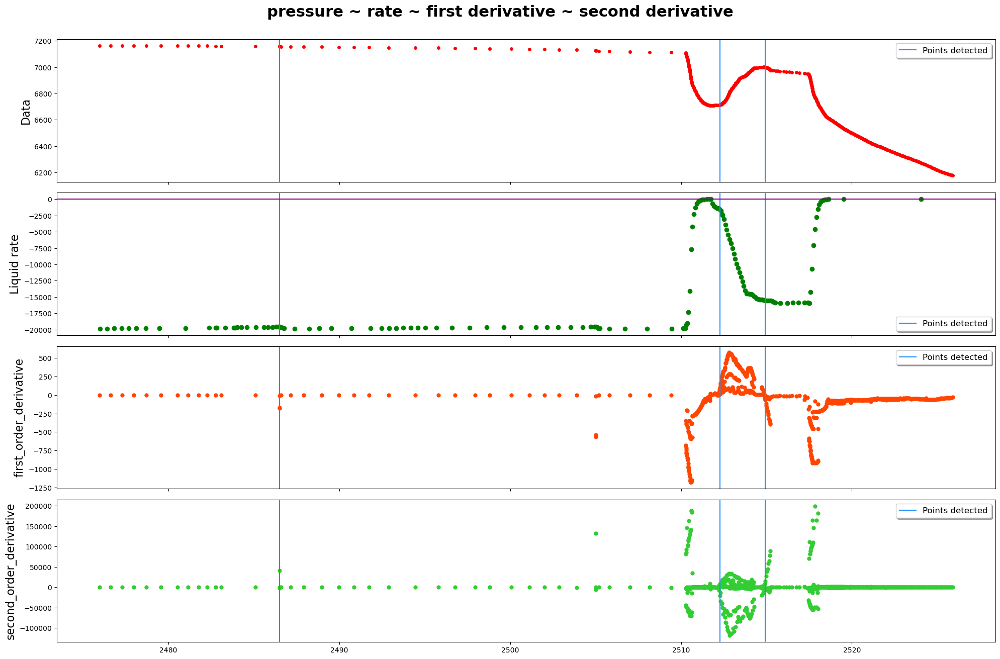

------row 30-----detected points:[20349, 20701]


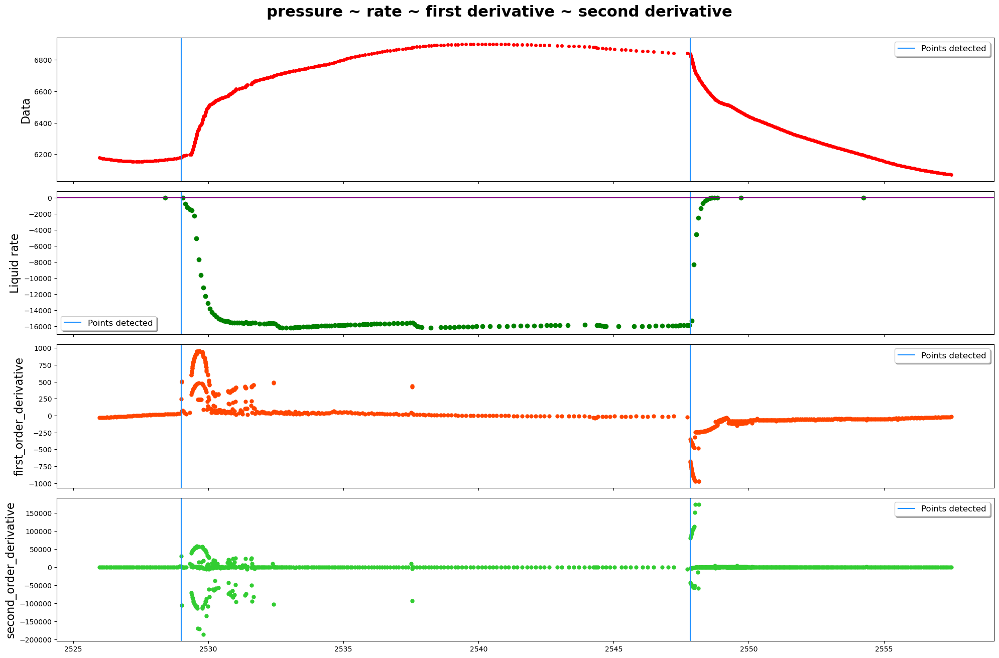

------row 31-----detected points:[21037]


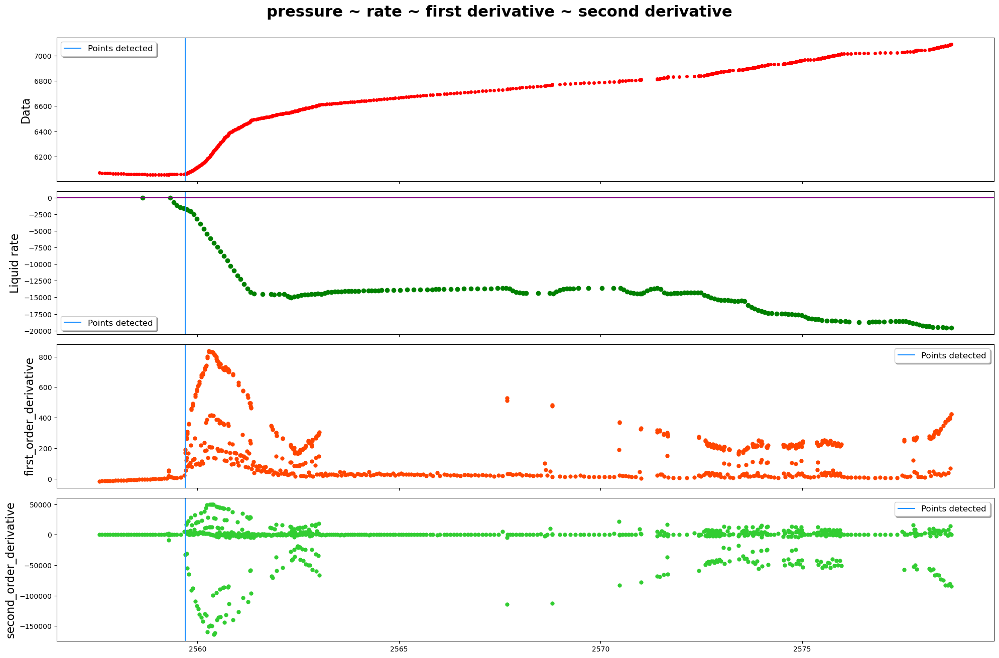

------row 32-----detected points:[21936, 22186]


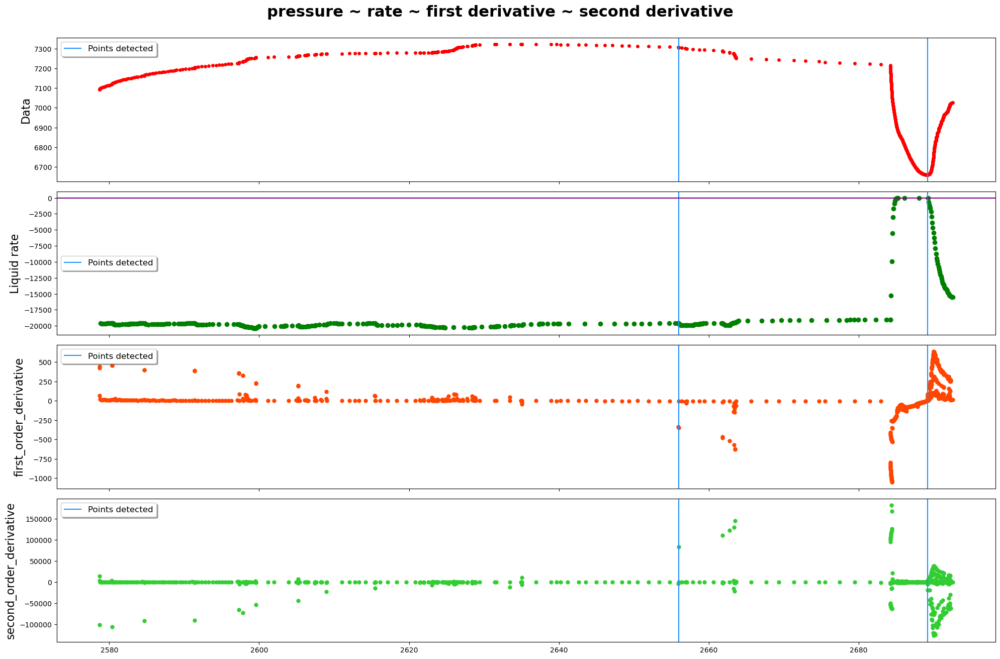

------row 33-----detected points:[22665]


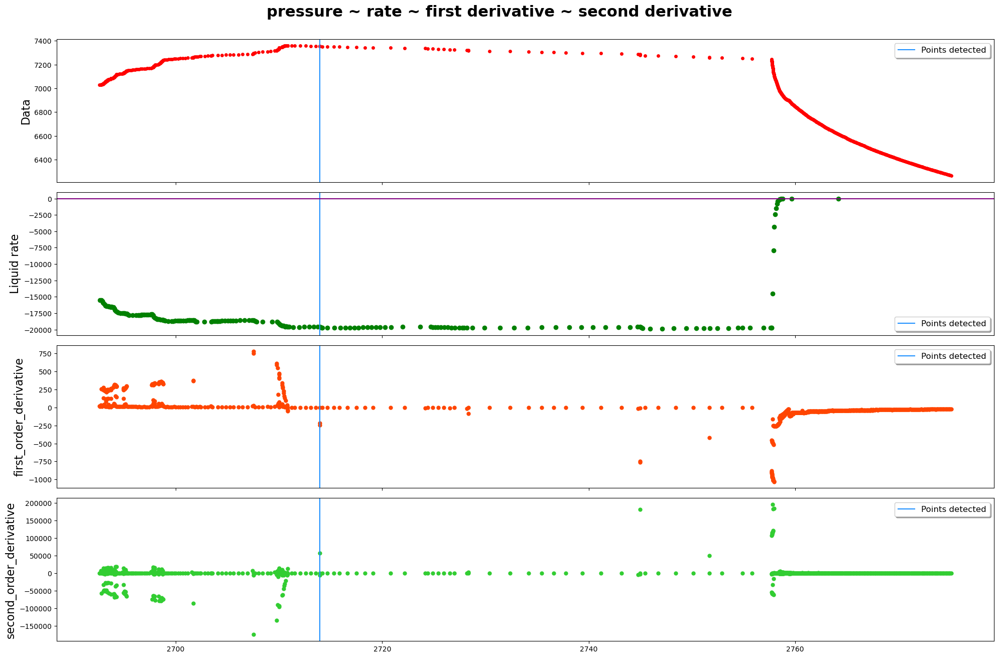

------row 34-----detected points:[23220]


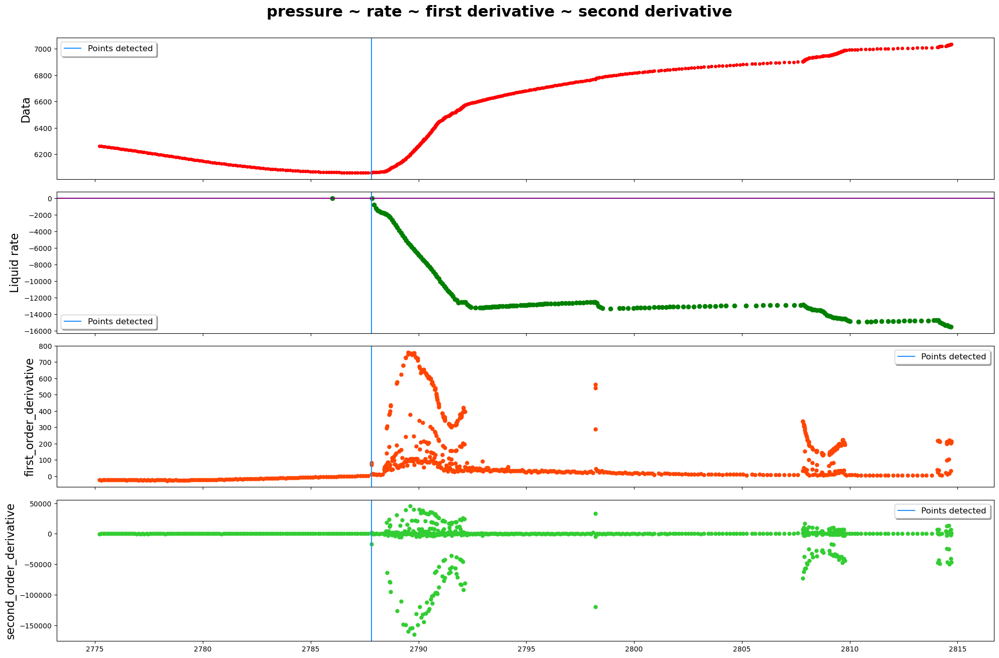

------row 35-----detected points:[24173]


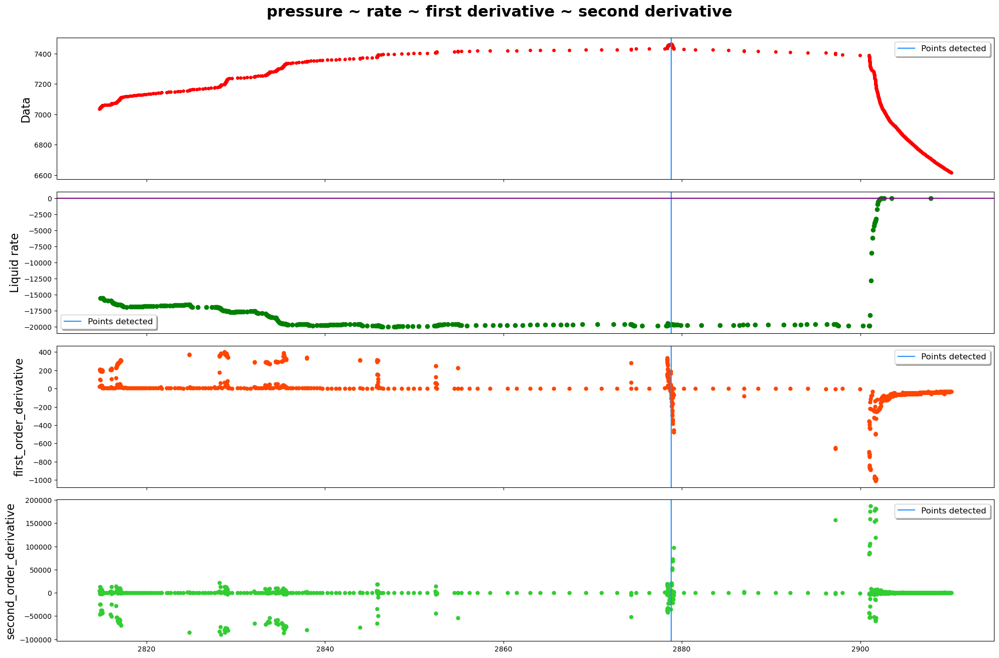

------row 36-----detected points:[24685, 24839, 24872, 24876]


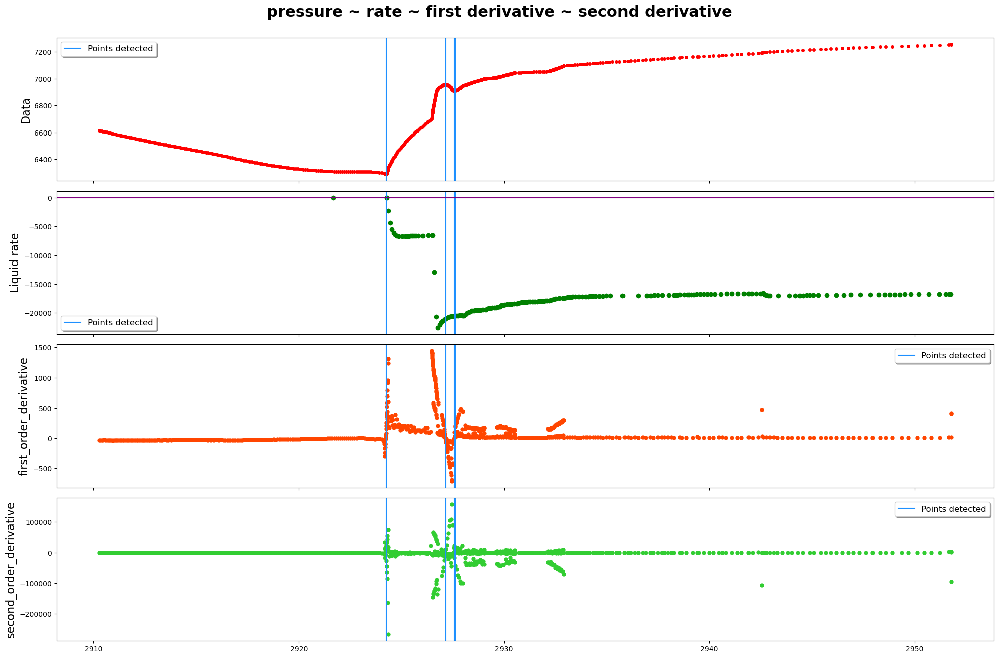

------row 37-----detected points:[25677]


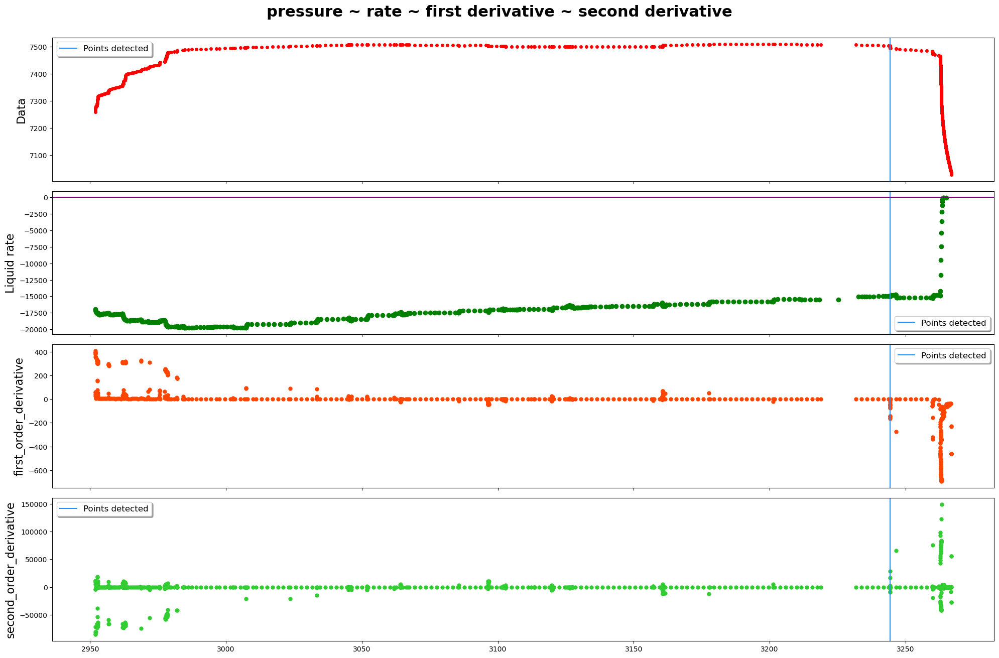

------row 38-----detected points:[26006, 26348, 26455]


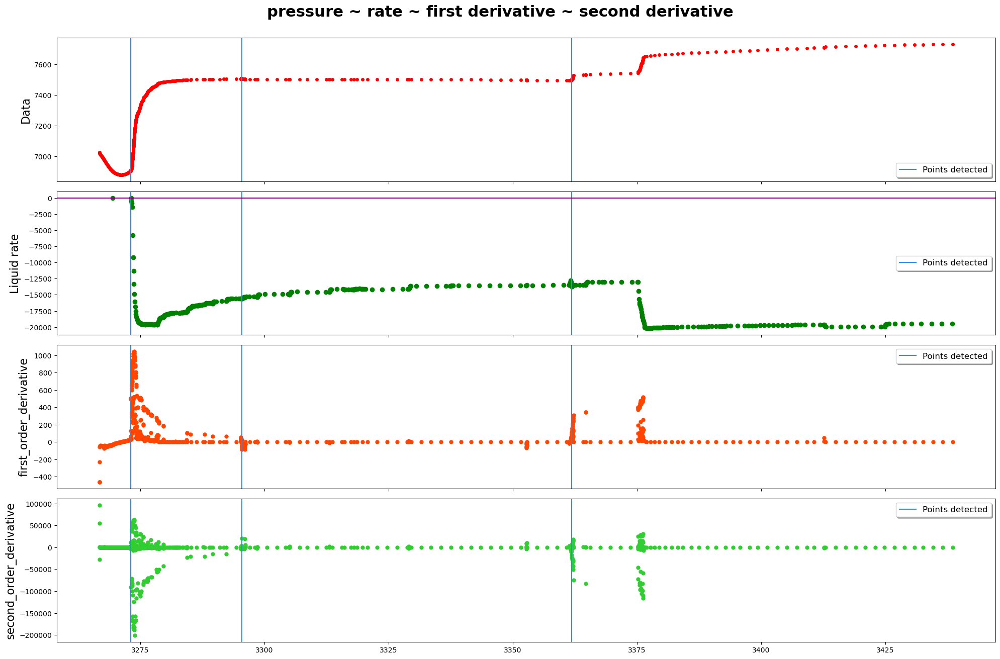

------row 39-----detected points:[26640, 26759, 26984]


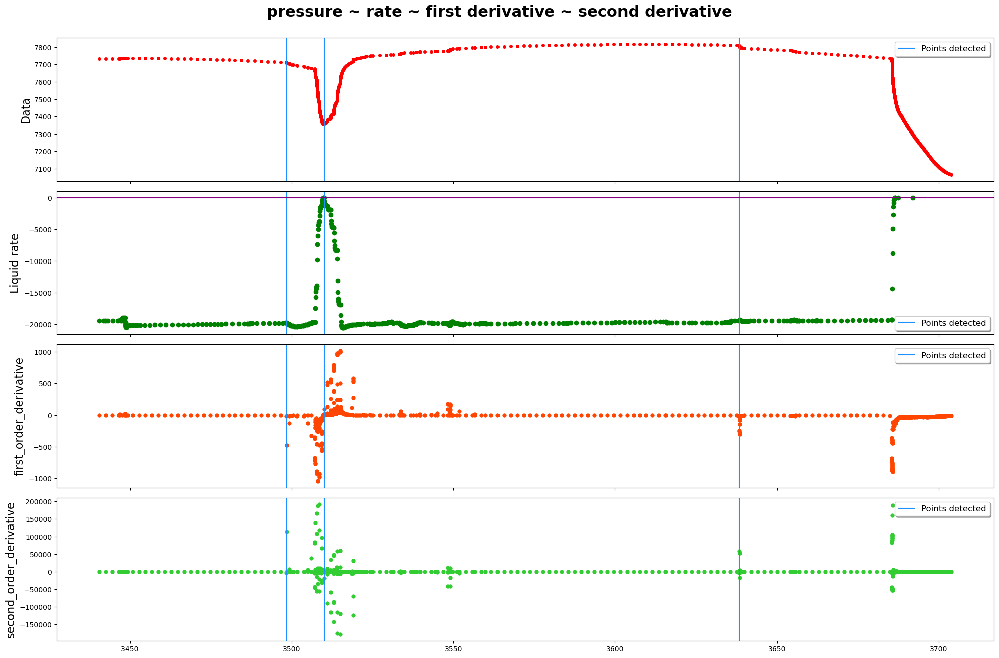

------row 40-----detected points:[27327, 27720, 27970]


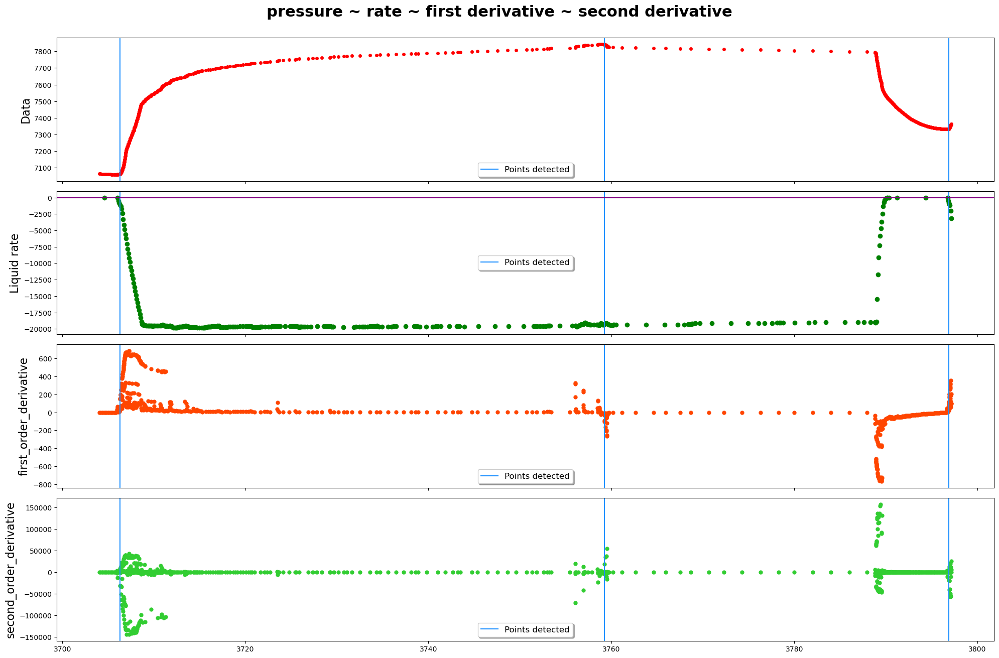

------row 41-----detected points:[28260, 28497]


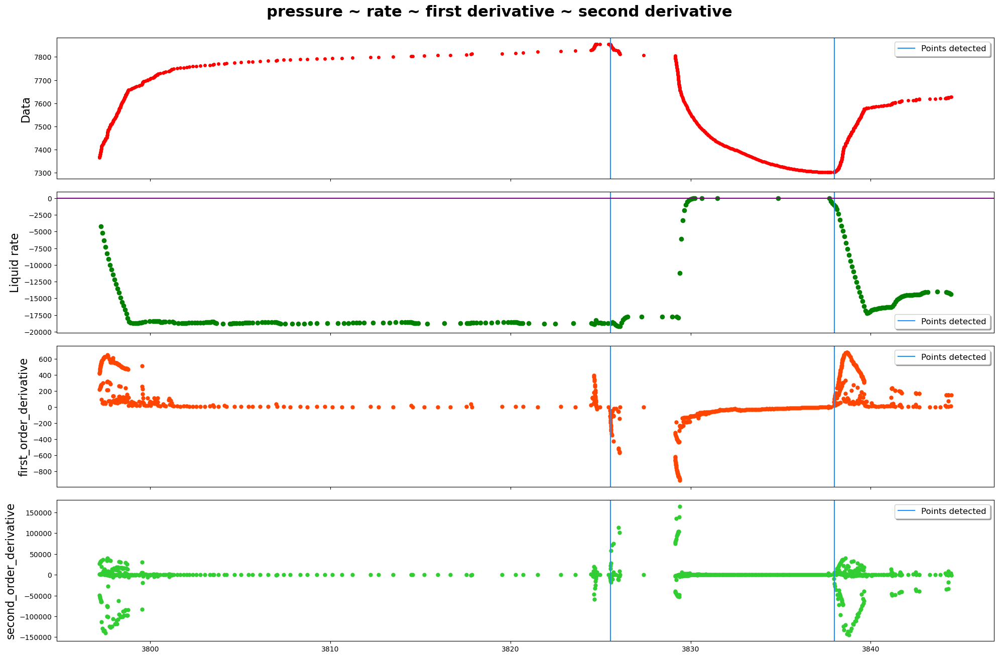

------row 42-----detected points:[28832, 29115]


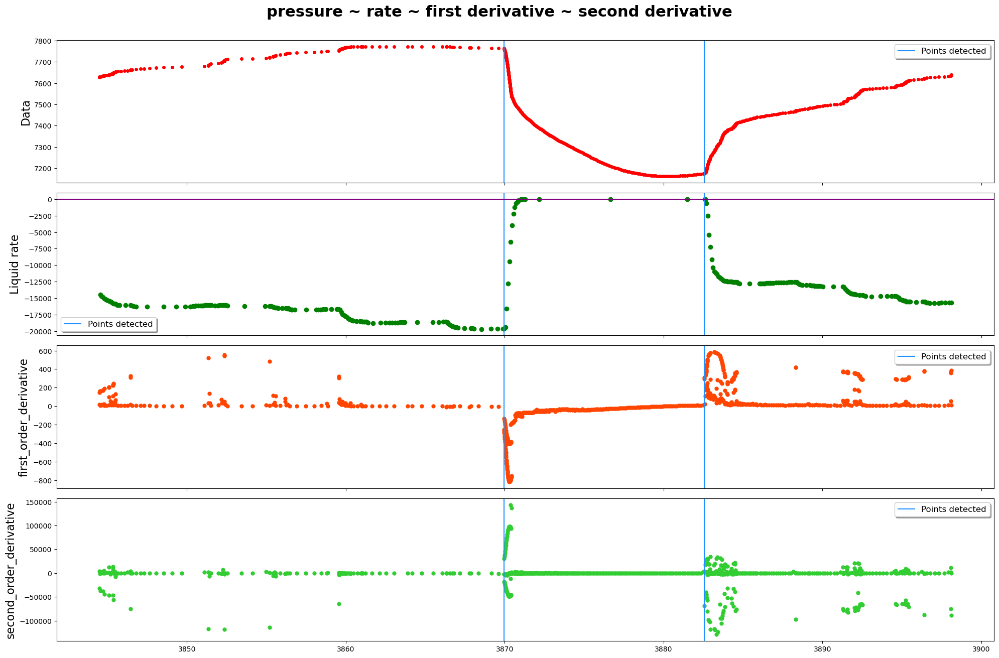

------row 43-----detected points:[]


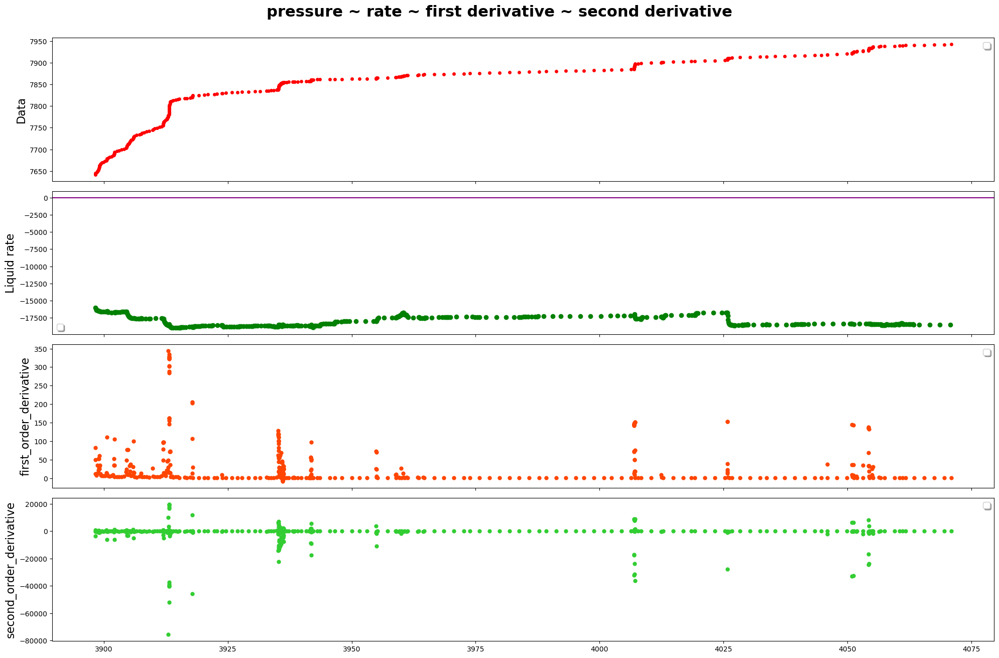

In [22]:
data_inOneRow=700
plot_4_metrics_details(data_inOneRow,
                       pressure_df_denoised,
                       rate_df,
                       breakpoints_detected_3SG,
                       ground_truth,
                       colum_names)

In [23]:
#S-G filter detect algorithm 4
# noise_threshold=0.3
# close_zero_threshold=0.5
# window_time_duration=8
# breakpoints_detected_4SG=detect_breakpoints_4(pressure_df_denoised,colum_names, noise_threshold,window_time_duration,close_zero_threshold)
# print(len(breakpoints_detected_4SG))
# plot_4_metrics(pressure_df_denoised,
#                rate_df,
#                breakpoints_detected_4SG,
#                ground_truth,
#                colum_names)

In [24]:
# notin3=[point for point in breakpoints_detected_4SG if point not in breakpoints_detected_3SG]
# print(len(breakpoints_detected_3SG),len(breakpoints_detected_4SG),len(notin3))
# data_inOneRow=700
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df_denoised,
#                        rate_df,
#                        breakpoints_detected_3SG,
#                        breakpoints_detected_4SG,
#                        colum_names)

In [25]:
data_inOneRow=700
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df_denoised,
#                        rate_df,
#                        breakpoints_detected_4SG,
#                        ground_truth,
#                        colum_names)

In [26]:
len(breakpoints_detected_3),len(breakpoints_detected_3SG)
index_zero_rate=[index for index, rate in enumerate(rate_df["Liquid rate"]) if rate==0]
print(index_zero_rate)
indexo_rate=[rate_df.iloc[index]["Elapsed time"] for index, rate in enumerate(rate_df["Liquid rate"]) if rate==0]
time_zero_rate=[rate_df.iloc[index]["Elapsed time"] for index, rate in enumerate(rate_df["Liquid rate"]) if rate==0]
len(time_zero_rate),time_zero_rate

[612, 840, 1055, 1277, 1490, 1746, 2141, 2297, 2577, 2894, 3083, 3629, 4060, 4403, 4687, 5180, 5810, 5958, 6698, 7177, 8855, 9594]


(22,
 [405.3250216668821,
  527.1083722224575,
  582.5500388891087,
  684.6853344445699,
  844.977126388927,
  964.993793055648,
  1229.352107777784,
  1288.653231251141,
  1418.160459722334,
  1495.343793055625,
  1538.818745555735,
  1865.877130833396,
  1951.179161388951,
  2084.704158055654,
  2144.825025139027,
  2381.404161388928,
  2528.408197638957,
  2558.633288472367,
  2786.01649597229,
  2921.674839305633,
  3704.607788611029,
  3881.482903889031])

In [27]:
breakpoints_zero_rate=[]
for time_rate in time_zero_rate:
    for index, time_pressure in enumerate(pressure_df["Elapsed time"]):
        if time_pressure>=time_rate:
            breakpoints_zero_rate. append(index)
            break
len(breakpoints_zero_rate) 
breakpoints_zero_rate
zero_rate={"index_zero_rate":index_zero_rate,"breakpoints_zero_rate":breakpoints_zero_rate}
zero_rate_df=pd.DataFrame(data=zero_rate)
zero_rate_df

,index_zero_rate,breakpoints_zero_rate
0,612,2467
1,840,3561
2,1055,4228
3,1277,4895
4,1490,5436
5,1746,6543
6,2141,7544
7,2297,8364
8,2577,9607
9,2894,10801


In [28]:
rate_df.iloc[1489]["Elapsed time"]
for index, time_pressure in enumerate(pressure_df["Elapsed time"]):
        if time_pressure>=rate_df.iloc[2893]["Elapsed time"]:
            print(index)
            break

10528


In [29]:
print(len(breakpoints_detected_3+breakpoints_detected_3SG+breakpoints_zero_rate+[5297]))
breakpoints_union=set(breakpoints_detected_3+breakpoints_detected_3SG+breakpoints_zero_rate+[5297]+[10216]+[10528]+[14774]+[16616]+[19764]+[20021]+[21030]+[25717]+[28322])
print(len(breakpoints_union))
# breakpoints_union

208
202


In [30]:
rate_df.iloc[1490], rate_df.iloc[1489]["Elapsed time"]

(Elapsed time    844.977126
 Liquid rate       0.000000
 Name: 1490, dtype: float64,
 837.4625141668366)

In [31]:
a=pressure_df.iloc[10150:10245]["Data"]
min(a)
pressure_df.loc[pressure_df["Data"]==min(a)]
pd.set_option('display.max_rows', pressure_df.shape[0]+1)
display(pressure_df.iloc[10150:10245])
delta=pressure_df.iloc[10151]["Elapsed time"]-pressure_df.iloc[10150]["Elapsed time"]
for i in range(10150,10223):
    t=pressure_df.iloc[i+1]["Elapsed time"]-pressure_df.iloc[i]["Elapsed time"]
    print(i,t,delta)
    if t>delta:
        delta=t
        pointer=i
i

,Elapsed time,Data
10150,1456.343793,5112.69
10151,1456.347960,5099.74
10152,1456.352126,5086.77
10153,1456.360460,5086.63
10154,1456.364626,5045.45
10155,1456.368793,5004.26
10156,1456.385460,5000.89
10157,1456.393793,5000.88
10158,1456.397960,4998.21
10159,1456.402126,4995.53


10150 0.004167000000052212 0.004167000000052212
10151 0.00416599999994105 0.004167000000052212
10152 0.008334000000104425 0.004167000000052212
10153 0.00416599999994105 0.008334000000104425
10154 0.004167000000052212 0.008334000000104425
10155 0.016666999999870313 0.008334000000104425
10156 0.008332999999993262 0.016666999999870313
10157 0.004167000000052212 0.016666999999870313
10158 0.00416599999994105 0.016666999999870313
10159 0.008334000000104425 0.016666999999870313
10160 0.00416599999994105 0.016666999999870313
10161 0.004167000000052212 0.016666999999870313
10162 0.016666999999870313 0.016666999999870313
10163 0.016665999999986525 0.016666999999870313
10164 0.016667000000097687 0.016666999999870313
10165 0.016667000000097687 0.016667000000097687
10166 0.016665999999986525 0.016667000000097687
10167 0.016666999999870313 0.016667000000097687
10168 0.016667000000097687 0.016667000000097687
10169 0.016665999999986525 0.016667000000097687
10170 0.016666999999870313 0.016667000000097

10222

In [32]:
# data_inOneRow=700
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df,
#                        rate_df,
#                        breakpoints_zero_rate,
#                        ground_truth,
#                        colum_names)

In [33]:
# data_inOneRow=500
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df,
#                        rate_df,
#                        list(breakpoints_union),
#                        ground_truth,
#                        colum_names)

In [34]:
bp=28310
pressure_df.iloc[bp-30:bp+30]


,Elapsed time,Data
28280,3825.862237,7853.98
28281,3825.962237,7856.35
28282,3826.003904,7856.37
28283,3826.008071,7854.17
28284,3826.012237,7852.07
28285,3826.053904,7851.04
28286,3826.058071,7848.17
28287,3826.062237,7845.42
28288,3826.078904,7842.20
28289,3827.378904,7844.26


In [35]:
a=[10245, 10499, 10021, 10149, 10150]
b=a.sort()
a,b

([10021, 10149, 10150, 10245, 10499], None)

In [36]:
breakpoints_union=set(breakpoints_detected_3SG+breakpoints_zero_rate+[5297]+[10216]+[10528]+[11340]+[12363]+[13868]+[14774]+[16616]+[16098]+[19764]+[20021]+[21030]+[25717]+[28322])
print(len(breakpoints_union))
# breakpoints_union

102


In [37]:
data_inOneRow=500
# plot_4_metrics_details(data_inOneRow,
#                        pressure_df,
#                        rate_df,
#                        list(breakpoints_union),
#                        ground_truth,
#                        colum_names)